### Configuración Inicial

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importamos todos los módulos que se van a utilizar y definimos funciones generales que se usan en distintas partes del trabajo.

In [9]:
!pip install dtreeviz
!pip install geopandas
!pip install pyclustertend
!pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import sklearn as sk
from sklearn.model_selection import (
    StratifiedKFold,
    KFold,
    RandomizedSearchCV,
    GridSearchCV,
    cross_val_score,
    cross_validate,
    train_test_split
)
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import (LinearRegression, LogisticRegressionCV)
from sklearn.ensemble import (IsolationForest, RandomForestClassifier, GradientBoostingRegressor)
from sklearn import tree
from sklearn.tree import (DecisionTreeClassifier, export_graphviz)
from sklearn import metrics
from sklearn.metrics import (
    make_scorer,
    confusion_matrix,
    auc,
    log_loss,
    r2_score,
    silhouette_score,
    recall_score, 
    accuracy_score, 
    f1_score,
)
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsRegressor

import dtreeviz.trees as dtreeviz
from tqdm import tqdm
from joblib import dump, load
from xgboost import XGBRegressor
from subprocess import call
from IPython.display import Image
from sklearn.decomposition import PCA
from pyclustertend import hopkins
from yellowbrick.cluster import SilhouetteVisualizer

import geopandas as gpd
import shapely

dataset = pd.read_csv("/content/drive/MyDrive/OrgaTP2/properati_argentina_2021.csv")
sns.set()

SEMILLA = 0
TEST_SIZE = 0.2


### Funciones útiles

Creamos algunas funciones que nos serán de utilidad para obtener un código más prolijo.

In [11]:
def obtener_frecuencia_relativa(series):
    frecuencia_absoluta = series.value_counts()
    frecuencia_relativa = frecuencia_absoluta / frecuencia_absoluta.sum()
    return frecuencia_relativa


def plot_confusion_matrix(y_test, y_pred, labels):
    cm = confusion_matrix(y_test, y_pred)
    fig = plt.figure()
    sns.heatmap(
        cm, annot=True, xticklabels=labels, yticklabels=labels, cmap="GnBu", fmt="g"
    )
    plt.title("Matriz de confusión")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()


def normalizar_estandar(x):
    scaler = StandardScaler()
    x_norm = scaler.fit_transform(x)
    return x_norm

def graficar_mapa_caba(dataset, color_map, hue, title):
    fig, ax = plt.subplots(figsize=(7, 10))

    df = dataset[
        (dataset["latitud"] < -34)
        & (dataset["latitud"] > -35)
        & (dataset["longitud"] > -59)
    ]
    gdf = gpd.GeoDataFrame(
        df.drop(["latitud", "longitud", hue], axis=1),
        crs={"init": "epsg:4326"},
        geometry=[shapely.geometry.Point(xy) for xy in zip(df.longitud, df.latitud)],
    )
    world = gpd.read_file("comunas_wgs84.shp")

    base = world.plot(ax=ax, color="white", edgecolor="black")

    gdf.plot(
        ax=base,
        marker="o",
        markersize=5,
        c=[color_map[label] for label in dataset[hue]],
    )
    ax.set(title=title, xlabel="Latitud", ylabel="Longitud")
    plt.show()

def imprimir_metricas_clasificacion(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred, average="weighted")
    f1 = f1_score(y_test, y_pred, average="weighted")

    print("Accuracy: " + str(accuracy))
    print("Recall: " + str(recall))
    print("F1 score: " + str(f1))

def imprimir_metricas_regresion(target_test, precios_predichos):
    # Mean Square Error
    mse = metrics.mean_squared_error(
        y_true=target_test, y_pred=precios_predichos, squared=True
    )

    print(f"El error (mse) de test es: {mse}")

    # Root Mean Square Error
    rmse = metrics.mean_squared_error(
        y_true=target_test, y_pred=precios_predichos, squared=False
    )

    print(f"El error (rmse) de test es: {rmse}")

    r2 = r2_score(target_test, precios_predichos)
    print(f"El score R2 es: {r2}")


# 1. Análisis Exploratorio y Preprocesamiento de Datos


## Separación Train-Test

En primer lugar separamos el dataset con el que se va a trabajar en dos: el 80% se utilizará para entrenar a los modelos y el 20% para testear que los modelos estén funcionando como se espera.

Se realiza la separación antes de comenzar a trabajar los datos para que durante la etapa de entrenamiento no haya conocimiento sobre los datos que luego se usarán para testear y así pueda predecir de forma adecuada.

In [12]:
dataset_train, dataset_test = train_test_split(
    dataset, test_size=TEST_SIZE, random_state=SEMILLA
)

print("Proporción - Train: {:.2f}".format(dataset_train.shape[0] / dataset.shape[0]))
print("Proporción - Test: {:.2f}".format(dataset_test.shape[0] / dataset.shape[0]))


Proporción - Train: 0.80
Proporción - Test: 0.20


## Filtrado del set de Training

Damos un primer vistazo al dataset, para observar las columnas y sus valores.

In [13]:
dataset_train.head(5)


,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
19012,f19OtftrEdr1twkOwQdmIw==,2021-01-27,2021-07-01,2021-01-27,NaN,NaN,Bs.As. G.B.A. Zona Norte,NaN,NaN,NaN,NaN,Venta,Casa,7.0,5.0,269.0,269.0,380000.0,USD,Casa - Zarate
418309,Ak3A3BAUvl8vjWRpGdMSqg==,2021-10-14,2021-11-03,2021-10-14,-34.400856,-58.649901,Bs.As. G.B.A. Zona Norte,Tigre,Nordelta,NaN,NaN,Venta,Departamento,3.0,2.0,95.0,88.0,170000.0,USD,DEPARTAMENTO VENTA ANTARES NORDELTA 3 AMBIENTE...
157888,K8U3zUGHru2nNfFhsz8ckA==,2021-05-26,2021-06-27,2021-05-26,-32.891939,-68.854564,Mendoza,Mendoza,NaN,NaN,NaN,Alquiler,Departamento,2.0,1.0,120.0,60.0,28500.0,ARS,"Alquiler DEPARTAMENTO en Ciudad, a mts Aristides"
405630,ZauA5QYZtApfKQkF5gIu+A==,2021-01-07,2021-09-03,2021-01-07,-34.895556,-57.977944,Bs.As. G.B.A. Zona Sur,La Plata,Tolosa,NaN,NaN,Venta,Casa,5.0,3.0,85.0,85.0,110000.0,USD,Duplex venta 3 dormitorios 2 baños 1 cochera 8...
147192,Cvf0fa9tdZflz/jma3g2Kw==,2021-08-19,2021-10-14,2021-08-19,-34.900083,-56.171641,Montevideo,NaN,NaN,NaN,NaN,Alquiler,Departamento,NaN,1.0,55.0,45.0,19900.0,UYU,Apartamento de 1 dormitorio en ALQUILER - Cordón


Definimos un diccionario de filtros que vamos a utilizar para filtrar nuestro dataset, y filtramos las columnas que no nos interesan; antes de filtrarlas, normalizamos sus valores por si hay alguna discrepancia (to lowercase).

In [14]:
filtro_tipo_propiedad = ["casa", "ph", "departamento"]
filtro_operacion = ["venta"]
filtro_ubicacion = ["capital federal"]
filtro_moneda = ["usd"]

filtros = {
    "property_type": filtro_tipo_propiedad,
    "operation": filtro_operacion,
    "place_l2": filtro_ubicacion,
    "property_currency": filtro_moneda,
}


def filtrado_columnas(dataset):
    for columna in filtros:
        dataset[columna] = dataset[columna].str.lower()

    for columna_a_filtrar, filtro in filtros.items():
        dataset = dataset[dataset[columna_a_filtrar].isin(filtro)]

    return dataset


dataset_train = filtrado_columnas(dataset_train)
dataset_test = filtrado_columnas(dataset_test)

dataset_train.shape


(75488, 20)

Observamos la proporción de datos NULL en las columnas del dataset.

In [15]:
filas_totales = dataset_train.shape[0]
proporcion_null = dataset_train.isna().sum() / filas_totales * 100
proporcion_null.sort_values(ascending=False, inplace=True)
proporcion_null


place_l6                    100.000000
place_l5                    100.000000
place_l4                     96.131836
property_bedrooms            11.532959
property_surface_total        5.129292
latitud                       3.972817
longitud                      3.972817
property_surface_covered      3.572753
property_rooms                1.092889
place_l3                      0.435831
property_currency             0.000000
property_price                0.000000
id                            0.000000
property_type                 0.000000
operation                     0.000000
start_date                    0.000000
place_l2                      0.000000
created_on                    0.000000
end_date                      0.000000
property_title                0.000000
dtype: float64

Vemos que las columnas `place_l5` y `place_l6` contienen `NaN` en todas sus filas y `place_4` contiene `NaN` en el 96% de sus filas. Por estas razones, eliminamos las columnas.

Las columnas `id` y `property_title` no nos sirven para predecir nada, ya que son valores arbitrarios que no aportan al análisis. Por lo que también las eliminamos.

Luego, debido al filtrado realizado previamente, las columnas `property_currency`, `place_l2`, `operation` contienen un solo valor posible, por lo que también las eliminamos ya que no aportan información extra al análisis.

En este trabajo, no vamos a analizar las variables temporales, por lo que también podemos retirar esas columnas del dataset



In [16]:
columnas_eliminar = [
    "property_title",
    "id",
    "place_l4",
    "place_l5",
    "place_l6",
    "property_currency",
    "operation",
    "place_l2",
    "start_date",
    "end_date",
    "created_on"
]


def eliminar_columnas(dataset, columnas_eliminar):
    dataset.drop(columnas_eliminar, axis=1, inplace=True)
    return dataset


dataset_train = eliminar_columnas(dataset_train, columnas_eliminar)
dataset_test = eliminar_columnas(dataset_test, columnas_eliminar)


Como `place_l3` no es un nombre muy significativo, lo renombramos a `barrio` y estandarizamos la columna, seteando los datos invalidos a None.

In [17]:
dataset_train = dataset_train.rename(columns={"place_l3": "barrio"})
dataset_train["barrio"] = dataset_train["barrio"].apply(
    lambda barrio: barrio if type(barrio) == str else None
)

dataset_test = dataset_test.rename(columns={"place_l3": "barrio"})
dataset_test["barrio"] = dataset_test["barrio"].apply(
    lambda barrio: barrio if type(barrio) == str else None
)


Como carecen de sentido, seteamos a NULL aquellos valores de `property_surface_total` y `property_surface_covered` que valgan menos de 30, ya que bastanta menor al tamaño promedio de los monoambientes (propiedad más chica posible).

In [18]:
def setear_null_superficie(fila):
    if fila["property_surface_total"] < 30:
        fila["property_surface_total"] = np.nan
    if fila["property_surface_covered"] < 30:
        fila["property_surface_covered"] = np.nan

    return fila


dataset_train = dataset_train.apply(setear_null_superficie, axis=1)
dataset_test = dataset_test.apply(setear_null_superficie, axis=1)


## Análisis Exploratorio

### Análisis Inicial


Observamos la estructura general del dataset.


In [19]:
dataset_train.shape


(75488, 9)

In [20]:
dataset_train.dtypes


latitud                     float64
longitud                    float64
barrio                       object
property_type                object
property_rooms              float64
property_bedrooms           float64
property_surface_total      float64
property_surface_covered    float64
property_price              float64
dtype: object

In [21]:
dataset_train.head(5)


,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price
83944,-34.554271,-58.457668,Belgrano,departamento,2.0,1.0,59.0,59.0,178000.0
195386,-34.613544,-58.368072,Monserrat,departamento,3.0,2.0,71.0,71.0,129000.0
293157,-34.571020,-58.433125,Palermo,departamento,2.0,1.0,79.0,59.0,249000.0
384577,-34.597384,-58.405139,Barrio Norte,departamento,4.0,3.0,91.0,85.0,165000.0
450142,-34.591646,-58.418064,Palermo,departamento,1.0,NaN,37.0,32.0,105000.0


Separamos el dataset en variables cualitativas y cuantitativas.

In [22]:
columnas_cuantitativas = [
    "latitud",
    "longitud",
    "property_rooms",
    "property_bedrooms",
    "property_surface_total",
    "property_surface_covered",
    "property_price",
]

variables_cuantitativas = dataset_train[columnas_cuantitativas]
variables_cuantitativas.head()


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price
83944,-34.554271,-58.457668,2.0,1.0,59.0,59.0,178000.0
195386,-34.613544,-58.368072,3.0,2.0,71.0,71.0,129000.0
293157,-34.571020,-58.433125,2.0,1.0,79.0,59.0,249000.0
384577,-34.597384,-58.405139,4.0,3.0,91.0,85.0,165000.0
450142,-34.591646,-58.418064,1.0,NaN,37.0,32.0,105000.0


In [23]:
columnas_cualitativas = ["barrio", "property_type"]
variables_cualitativas = dataset_train[columnas_cualitativas]
variables_cualitativas.head()


,barrio,property_type
83944,Belgrano,departamento
195386,Monserrat,departamento
293157,Palermo,departamento
384577,Barrio Norte,departamento
450142,Palermo,departamento


### Variables Cuantitativas

En primer lugar, generamos estadísticas descriptivas para las columnas cuantitativas (medidas de resumen).

In [24]:
variables_cuantitativas.describe()


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price
count,72489.000000,72489.000000,74663.000000,66782.000000,69148.000000,68722.000000,7.548800e+04
mean,-34.591551,-58.448800,2.824130,2.014255,114.254179,93.529525,2.263084e+05
std,0.181312,0.282378,1.419647,1.126561,1088.243911,1133.224474,3.213432e+05
min,-53.788624,-71.438923,1.000000,1.000000,30.000000,30.000000,5.000000e+03
25%,-34.616027,-58.466524,2.000000,1.000000,46.000000,42.000000,9.500000e+04
50%,-34.595870,-58.438917,3.000000,2.000000,67.000000,60.000000,1.440000e+05
75%,-34.577492,-58.408846,4.000000,3.000000,107.000000,91.000000,2.380000e+05
max,-24.219827,-54.133330,40.000000,70.000000,137000.000000,217000.000000,2.140000e+07


Luego, graficamos un mapa de correlaciones.

Text(0.5, 1.0, 'Correlación entre variables cuantitativas')

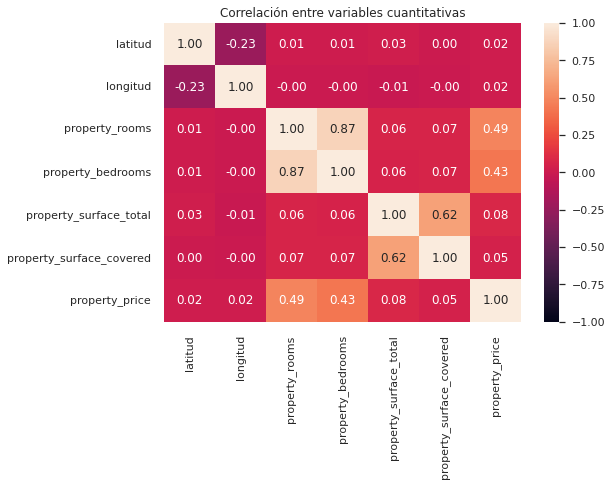

In [25]:
matriz_correlaciones = variables_cuantitativas.corr()
sns.heatmap(data=matriz_correlaciones, annot=True, fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlación entre variables cuantitativas")


Observamos que las variables más relacionadas son:
 - `property_rooms` con `property_bedrooms`
 - `property_surface_covered` con `property_surface_total`
 
 y en menor medida:
 - `property_price` con `property_rooms` y `property_bedrooms`


Realizamos graficos para observar estas relaciones de forma más clara.

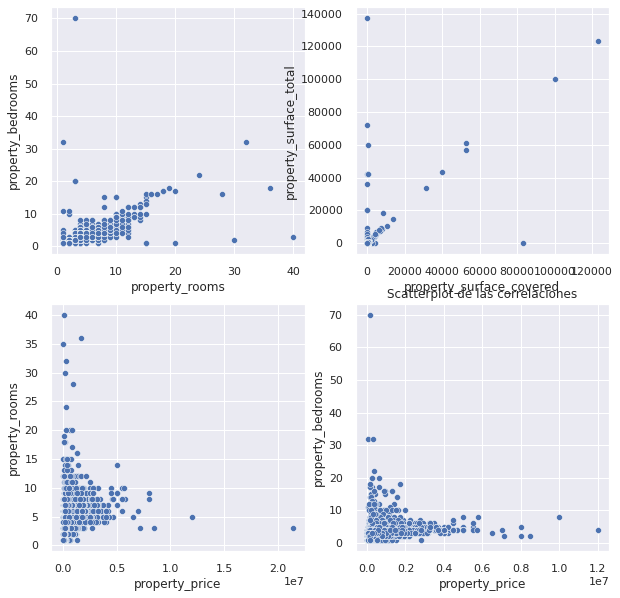

In [26]:
figs, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = np.ndarray.flatten(axes)

correlaciones = (
    ("property_rooms", "property_bedrooms"),
    ("property_surface_covered", "property_surface_total"),
    ("property_price", "property_rooms"),
    ("property_price", "property_bedrooms"),
)
plt.title("Scatterplot de las correlaciones")
for (i, correlacion) in enumerate(correlaciones):
    sns.scatterplot(ax=axes[i], data=dataset_train, x=correlacion[0], y=correlacion[1])


Observamos que hay cierta relación lineal, pero es afectada por el alto número de valores atípicos. Si se los elimina de forma "burda" se puede ver que el gráfico cambia drásticamente, por lo que luego será necesario hacer un tratamiento de esos valores.

Graficamos con un _alpha_ para observar mejor la distribución.

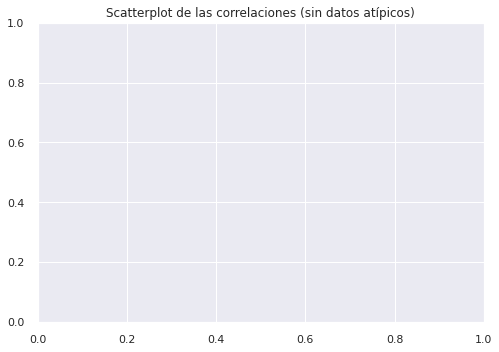

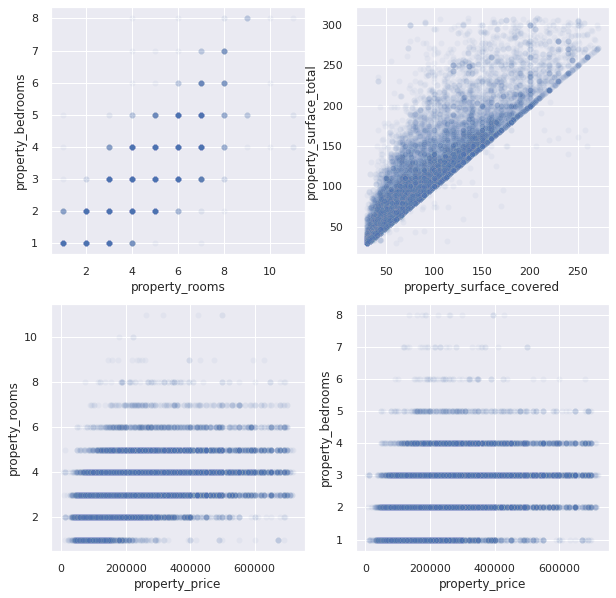

In [27]:
columnas = (
    "property_surface_covered",
    "property_surface_total",
    "property_rooms",
    "property_bedrooms",
    "property_price",
)
sin_atipicos = dataset_train.copy()
for columna in columnas:
    sin_atipicos = sin_atipicos[
        sin_atipicos[columna] < sin_atipicos[columna].quantile(0.75) * 3
    ]

plt.title("Scatterplot de las correlaciones (sin datos atípicos)")
figs, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = np.ndarray.flatten(axes)
for (i, correlacion) in enumerate(correlaciones):
    sns.scatterplot(
        ax=axes[i], data=sin_atipicos, x=correlacion[0], y=correlacion[1], alpha=0.05
    )


### Variables Cualitativas

Analizamos la cantidad de valores posibles de cada variable.


In [28]:
variables_cualitativas.nunique()


barrio           57
property_type     3
dtype: int64

Graficamos la distribución de los barrios y del tipo de propiedad.

[Text(0, 0.5, 'frecuencia'),
 Text(0.5, 0, 'tipo de propiedad'),
 Text(0.5, 1.0, 'Distribución del tipo de propiedad')]

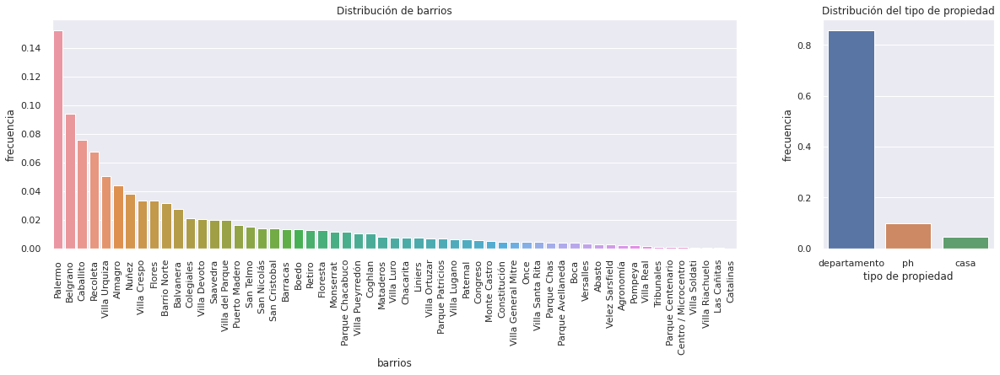

In [29]:
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(20, 5), gridspec_kw={"width_ratios": [4, 1]}
)

frecuencia_relativa = obtener_frecuencia_relativa(variables_cualitativas["barrio"])
ax = sns.barplot(ax=axes[0], x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(title="Distribución de barrios", xlabel="barrios", ylabel="frecuencia")
ax.tick_params("x", labelrotation=90)

frecuencia_relativa = obtener_frecuencia_relativa(
    variables_cualitativas["property_type"]
)
ax = sns.barplot(ax=axes[1], x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(
    title="Distribución del tipo de propiedad",
    xlabel="tipo de propiedad",
    ylabel="frecuencia",
)


 ## Análisis de Valores Atípicos Univariados

Primero realizamos un **BOXPLOT** de las variables cuantitativas para observar de forma rápida la distribución de _outliers univariados_.

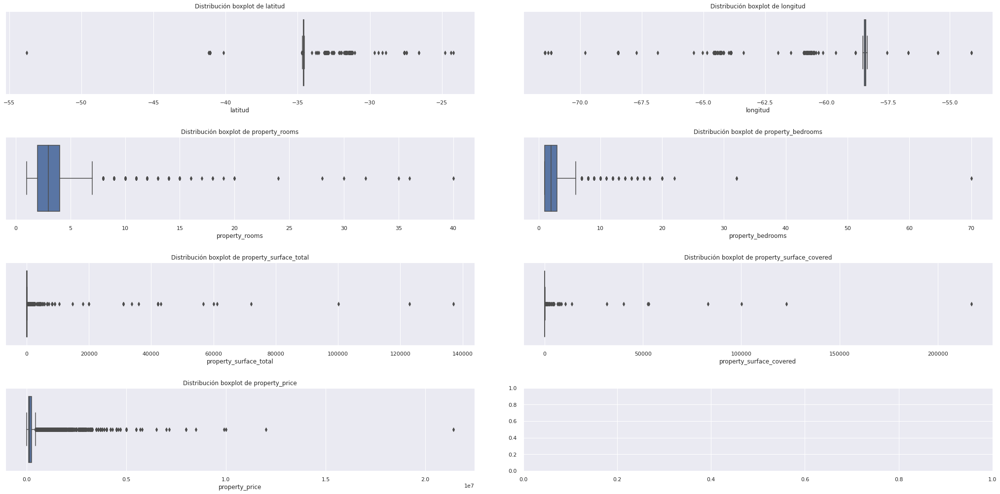

In [30]:
figs, axes = plt.subplots(nrows=4, ncols=2, figsize=(30, 15))
figs.tight_layout(pad=5)
axes = np.ndarray.flatten(axes)
for (i, columna) in enumerate(variables_cuantitativas.columns):
    grafico = sns.boxplot(ax=axes[i], x=variables_cuantitativas[columna])
    grafico.set(xlabel=columna)
    grafico.set(title=f"Distribución boxplot de {columna}")


Observamos que quedan muchos valores que se salen del rango intercuartil, por lo que podemos eliminar aquellos que quedan fuera de: rango intercuartil * 3; es decir, los outliers univariados severos.

In [31]:
for columna in variables_cuantitativas.columns:
    columna_q1 = dataset_train[columna].quantile(0.25)
    columna_q3 = dataset_train[columna].quantile(0.75)
    iqr = columna_q3 - columna_q1

    lim_superior = columna_q3 + 3 * iqr
    lim_inferior = columna_q1 - 3 * iqr

    filtro_columna = (dataset_train[columna] >= lim_superior) | (
        dataset_train[columna] <= lim_inferior
    )
    indices = dataset_train[filtro_columna].index
    dataset_train.drop(index=indices, inplace=True)

    filtro_columna_test = (dataset_test[columna] >= lim_superior) | (
        dataset_test[columna] <= lim_inferior
    )
    indices_test = dataset_test[filtro_columna_test].index
    dataset_test.drop(index=indices_test, inplace=True)


Al realizar nuevamente el **BOXPLOT**, observamos que la distribuciones son mucho más uniformes.

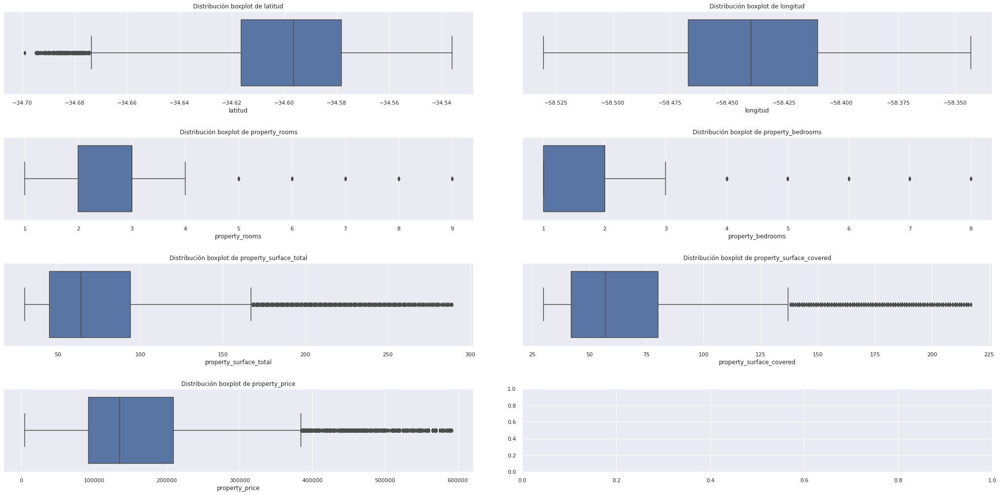

In [32]:
variables_cuantitativas = dataset_train[columnas_cuantitativas]
figs, axes = plt.subplots(nrows=4, ncols=2, figsize=(30, 15))
figs.tight_layout(pad=5)
axes = np.ndarray.flatten(axes)
for (i, columna) in enumerate(variables_cuantitativas.columns):
    grafico = sns.boxplot(ax=axes[i], x=variables_cuantitativas[columna])
    grafico.set(xlabel=columna)
    grafico.set(title=f"Distribución boxplot de {columna}")


Observamos que, si bien las distribuciones mejoraron significativamente, es necesario realizar un análisis más detallado ya que hay algunos casos extraños. Identificamos: el valor de `property_surface_covered` no debería ser mayor que `property_surface_total`, `property_bedrooms` no debería ser mayor a `property_rooms`, entre otros. 

Imprimimos la cantidad de observaciones donde se ven estas anomalías.


In [33]:
print("Cantidad de observaciones con superficie total menor a superficie cubierta: ",
    dataset_train[
        dataset_train.property_surface_total < dataset_train.property_surface_covered
    ].shape[0]
)
print(
    "Cantidad de observaciones con cantidad de dormitorios mayor a cantidad de ambientes: ",
    dataset_train[dataset_train.property_bedrooms > dataset_train.property_rooms].shape[0]
)


Cantidad de observaciones con superficie total menor a superficie cubierta:  90
Cantidad de observaciones con cantidad de dormitorios mayor a cantidad de ambientes:  66


Como no son muchos casos, los eliminamos para poder tener un mejor análisis y que no afecten de forma negativa la imputación.

In [34]:
dataset_train = dataset_train[
    ~(dataset_train.property_surface_covered > dataset_train.property_surface_total)
]
dataset_train = dataset_train[
    ~(dataset_train.property_bedrooms > dataset_train.property_rooms)
]

dataset_test = dataset_test[
    ~(dataset_test.property_surface_covered > dataset_test.property_surface_total)
]
dataset_test = dataset_test[
    ~(dataset_test.property_bedrooms > dataset_test.property_rooms)
]


## Análisis de datos faltantes


Graficamos la distribución de datos nulos.

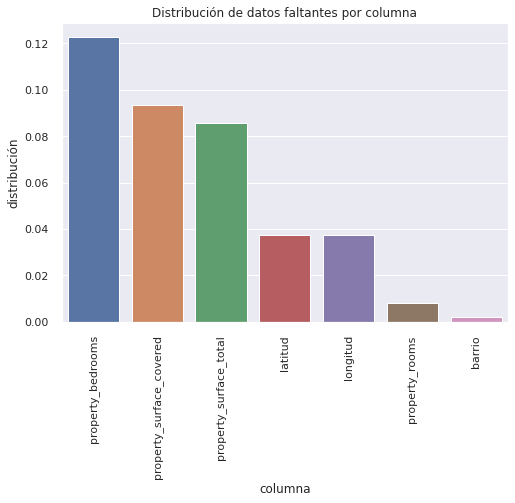

In [35]:
cantidad_de_datos_nulos_por_columna = dataset_train.isna().sum()
frecuencia_relativa = cantidad_de_datos_nulos_por_columna / dataset_train.shape[0]
frecuencia_relativa = frecuencia_relativa[frecuencia_relativa.values != 0]
frecuencia_relativa = frecuencia_relativa.sort_values(ascending=False)

ax = sns.barplot(x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(
    title="Distribución de datos faltantes por columna",
    xlabel="columna",
    ylabel="distribución",
)
ax.tick_params("x", labelrotation=90)


Graficamos la distribución de cantidad de datos faltantes por fila. 


[Text(0, 0.5, 'proporcion'),
 Text(0.5, 0, 'cantidad de datos faltantes por fila'),
 Text(0.5, 1.0, 'Proporcion de datos faltantes por fila')]

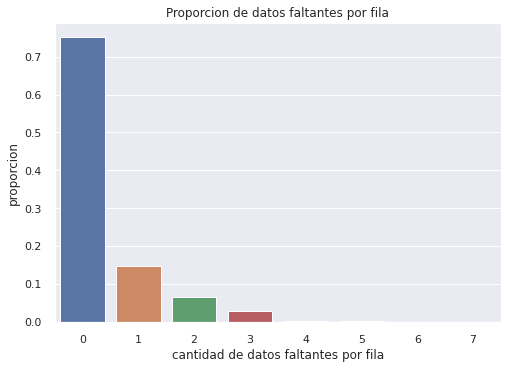

In [36]:
distribucion_faltantes_por_fila = (
    dataset_train.isna().sum(axis=1).value_counts() / dataset_train.shape[0]
)
ax = sns.barplot(
    x=distribucion_faltantes_por_fila.index,
    y=distribucion_faltantes_por_fila.values,
)
ax.set(
    xlabel="cantidad de datos faltantes por fila",
    ylabel="proporcion",
    title="Proporcion de datos faltantes por fila",
)


Vemos que quedan pocas filas con datos faltantes, por lo que podemos imputarlas.

## Imputación de datos faltantes

Algunas estrategias para imputar los datos faltantes son:

- Sustitución de Casos: Se reemplaza con valores no observados. Hay que consultar con un experto.
- Sustitución por Media: Se reemplaza utilizando la medida calculada de los valores presentes. Sin embargo, esto trae consecuencias
    - La varianza estimada por la nueva variable no es válida ya que es atenuada por los valores repetidos
    - Se distorsiona la distribución
    - Las correlaciones que se observen estarán deprimidas debido a la repetición de un solo valor constante.
- Imputación Cold Deck: Se pueden obtener los datos faltantes a partir de otras variables del dataset.
- Imputacion Hot Deck: Se reemplazan los datos faltante con los valores que resultan más “similares”. Tenemos que definir qué es “similar”, para ello se puede usar la técnica: K vecinos más cercanos.
- Imputación por Regresión: El dato faltante se reemplaza con el valor predicho por un modelo de regresión.
- MICE (multivariate imputation by chained equations): Trabaja bajo el supuesto de que el origen de los datos es MAR (missing at random). Es un proceso de imputación iterativo, donde en cada iteración los valores faltantes se predicen en función de las variables restantes. El proceso se repite hasta que se encuentre consistencia en los datos (usualmente 10 iteraciones es suficiente). La primera iteración se realiza por uno de los métodos vistos anteriormente para rellenar los datos faltantes.

### Imputación de `property_bedrooms`, `property_rooms`, `property_price`

Anteriormente observamos que existe una correlación entre `property_bedrooms`, `property_rooms` y `property_price`. Podemos entrenar un modelo lineal para predecir los datos faltantes.

Imputamos los datos utilizando un imputador iterativo.

In [37]:
columnas_a_imputar = ["property_bedrooms", "property_rooms", "property_price"]

modelo_lineal = LinearRegression()
imp = IterativeImputer(
    estimator=modelo_lineal,
    missing_values=np.nan,
    min_value=(1, 1, 50000),
    max_iter=20,
    random_state=SEMILLA,
)

imp.fit(dataset_train[columnas_a_imputar])


def imputar_columnas(modelo, dataset, columnas_a_imputar):
    columnas_imputadas = modelo.transform(dataset[columnas_a_imputar])
    return pd.DataFrame(columnas_imputadas, columns=columnas_a_imputar).astype(int)


dataset_imputado = imputar_columnas(imp, dataset_train, columnas_a_imputar)
dataset_test_imputado = imputar_columnas(imp, dataset_test, columnas_a_imputar)


Observamos que tienen la misma distribución que los datos originales.

[Text(0.5, 0, 'precio de propiedad (usd)'),
 Text(0.5, 1.0, 'Distribución de precio de propiedad (imputado)')]

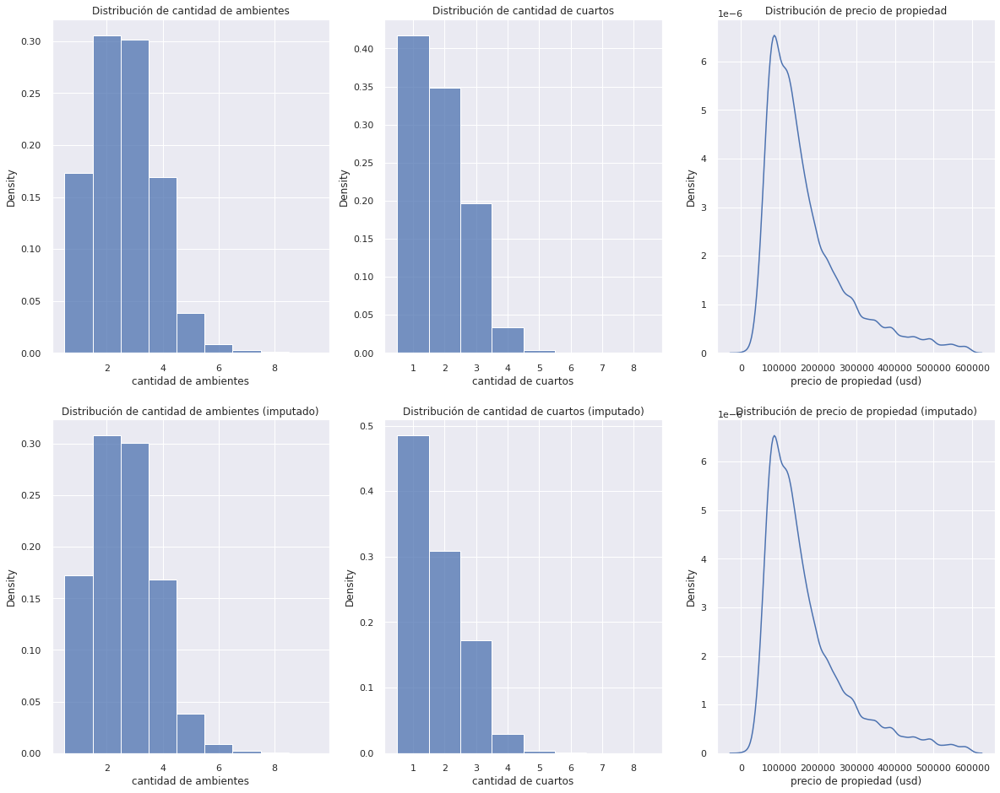

In [38]:
figs, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 16))

ax = sns.histplot(
    ax=axes[0][0], x=dataset_train.property_rooms, discrete=True, stat="density"
)
ax.set(title="Distribución de cantidad de ambientes", xlabel="cantidad de ambientes")

ax = sns.histplot(
    ax=axes[0][1], x=dataset_train.property_bedrooms, discrete=True, stat="density"
)
ax.set(title="Distribución de cantidad de cuartos", xlabel="cantidad de cuartos")

ax = sns.kdeplot(ax=axes[0][2], x=dataset_train.property_price)
ax.set(title="Distribución de precio de propiedad", xlabel="precio de propiedad (usd)")

ax = sns.histplot(
    ax=axes[1][0], x=dataset_imputado.property_rooms, discrete=True, stat="density"
)
ax.set(
    title="Distribución de cantidad de ambientes (imputado)",
    xlabel="cantidad de ambientes",
)

ax = sns.histplot(
    ax=axes[1][1], x=dataset_imputado.property_bedrooms, discrete=True, stat="density"
)
ax.set(
    title="Distribución de cantidad de cuartos (imputado)", xlabel="cantidad de cuartos"
)

ax = sns.kdeplot(ax=axes[1][2], x=dataset_imputado.property_price)
ax.set(
    title="Distribución de precio de propiedad (imputado)", xlabel="precio de propiedad (usd)"
)


Actualizamos los valores imputados en el nuevo dataframe y vemos que las columnas imputadas ya no tienen valores faltantes.

In [39]:
dataset_test[columnas_a_imputar] = dataset_test_imputado[columnas_a_imputar].values
dataset_train[columnas_a_imputar] = dataset_imputado[columnas_a_imputar].values

dataset_train.isna().sum()


latitud                     2595
longitud                    2595
barrio                       149
property_type                  0
property_rooms                 0
property_bedrooms              0
property_surface_total      5968
property_surface_covered    6488
property_price                 0
dtype: int64

### Imputación de `property_surface_covered`, `property_surface_total`


También habíamos observado una correlación entre `property_surface_covered`, `property_surface_total` por lo que podemos entrenar otro modelo lineal para predecir estos datos faltantes. 

Imputamos los datos utilizando un imputador iterativo.

In [40]:
columnas_a_imputar = ["property_surface_covered", "property_surface_total"]

modelo_lineal = LinearRegression()
imp = IterativeImputer(
    estimator=modelo_lineal,
    missing_values=np.nan,
    max_iter=20,
    min_value=(30, 30),
    verbose=0,
    random_state=SEMILLA,
)

imp.fit(dataset_train[columnas_a_imputar])

dataset_imputado = imputar_columnas(imp, dataset_train, columnas_a_imputar)
dataset_test_imputado = imputar_columnas(imp, dataset_test, columnas_a_imputar)


Observamos que tienen una distribución parecida a la de los datos originales.

[Text(0.5, 0, 'superficie total (m2)'),
 Text(0.5, 1.0, 'Distribución de superficie total (imputado)')]

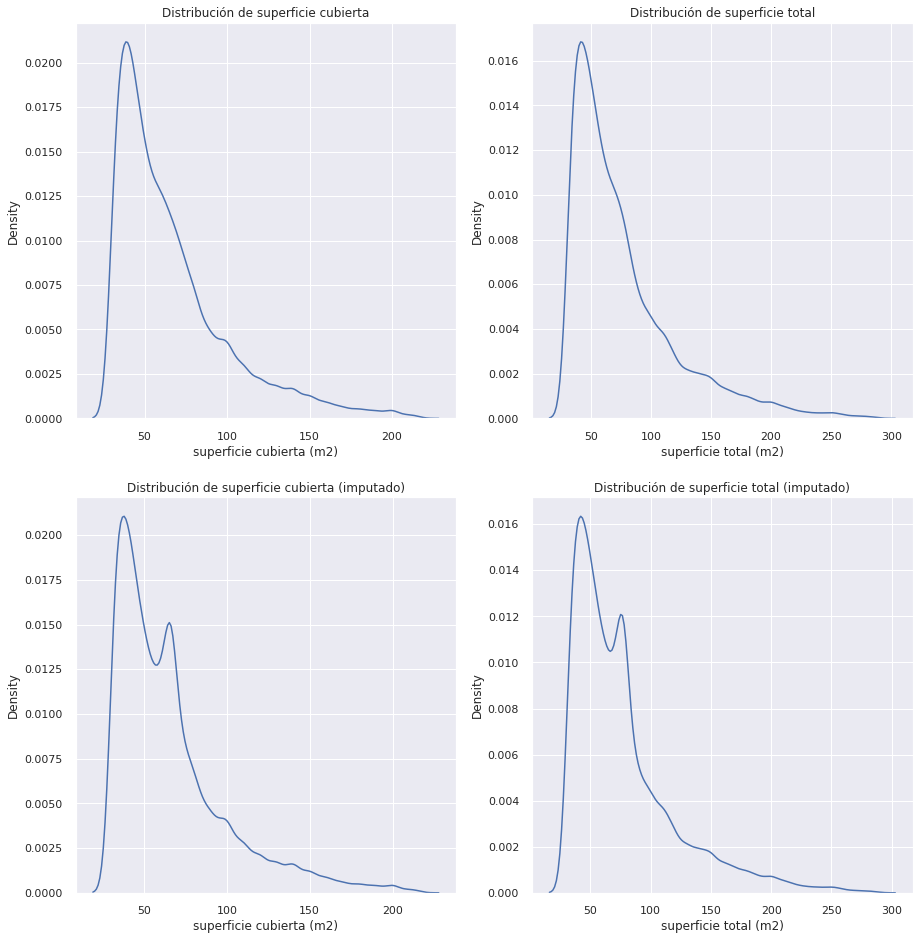

In [41]:
figs, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 16))

ax = sns.kdeplot(ax=axes[0][0], x=dataset_train.property_surface_covered)
ax.set(title="Distribución de superficie cubierta", xlabel="superficie cubierta (m2)")

ax = sns.kdeplot(ax=axes[0][1], x=dataset_train.property_surface_total)
ax.set(title="Distribución de superficie total", xlabel="superficie total (m2)")

ax = sns.kdeplot(ax=axes[1][0], x=dataset_imputado.property_surface_covered)
ax.set(
    title="Distribución de superficie cubierta (imputado)", xlabel="superficie cubierta (m2)"
)

ax = sns.kdeplot(ax=axes[1][1], x=dataset_imputado.property_surface_total)
ax.set(title="Distribución de superficie total (imputado)", xlabel="superficie total (m2)")


Observamos que la distribución es levemente distinta, apareciendo más datos con un valor entre 50 y 100; podemos suponer que sucede porque el modelo realiza una imputación por mediana. 

Actualizamos los valores imputados en el nuevo dataframe y observamos que ahora las columnas imputadas ya no tienen datos nulos.

In [42]:
dataset_train[columnas_a_imputar] = dataset_imputado[columnas_a_imputar].values
dataset_test[columnas_a_imputar] = dataset_test_imputado[columnas_a_imputar].values

dataset_train.isna().sum()


latitud                     2595
longitud                    2595
barrio                       149
property_type                  0
property_rooms                 0
property_bedrooms              0
property_surface_total         0
property_surface_covered       0
property_price                 0
dtype: int64

### Imputacion `barrio` por `coordenadas`

Podemos entrenar un modelo que pueda predecir el barrio a partir de las coordenadas.

In [43]:
dataset_forest = dataset_train.copy()
dataset_forest.dropna(inplace=True)

factorizacion_barrio = pd.factorize(dataset_forest["barrio"])
dataset_forest["barrio"] = factorizacion_barrio[0]
definiciones_barrio = factorizacion_barrio[1]

atributos = ["latitud", "longitud"]

target = "barrio"

X = dataset_forest[atributos]
y = dataset_forest[target]

clasificador_rfc = DecisionTreeClassifier(
    random_state=SEMILLA,
)


Separamos en train y test, y escalamos los datos para mayor performance.

In [44]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=SEMILLA
)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Ahora, entrenamos el modelo y vemos su desempeño

In [45]:
clasificador_rfc.fit(X_train, y_train)
print("Accuracy: ", clasificador_rfc.score(X_test, y_test))

Accuracy:  0.8206680116565792


El desempeño es excelente, lo podemos utilizar para imputar los barrios faltantes. Sin embargo, solo lo podemos aplicar en filas que contengan ambas coordenadas.

In [46]:
def imputar_barrio(fila):
    if fila["barrio"] != None:
        return fila

    if fila[atributos].isna().any():
        return fila

    barrio = clasificador_rfc.predict([fila[atributos].copy()])

    fila["barrio"] = definiciones_barrio[barrio[0]]

    return fila


dataset_train = dataset_train.apply(imputar_barrio, axis=1)
dataset_test = dataset_test.apply(imputar_barrio, axis=1)


Observamos la distribución de faltantes hasta ahora.

In [47]:
dataset_train.isna().sum()


latitud                     2595
longitud                    2595
barrio                       106
property_type                  0
property_rooms                 0
property_bedrooms              0
property_surface_total         0
property_surface_covered       0
property_price                 0
dtype: int64

### Imputación de `latitud`, `longitud` según `barrio`

Primero, buscamos el punto medio de cada barrio, para luego reemplazarlo en las coordenadas faltantes.

In [48]:
columnas_ubicacion = ["latitud", "longitud", "barrio"]
dataset_ubicaciones = dataset_train[columnas_ubicacion]
promedio_ubicaciones = dataset_ubicaciones.groupby("barrio").mean()


Ahora, podemos reemplazar los datos de latitud y longitud faltantes con el promedio para el barrio al que pertenecen.

In [49]:
def imputar_cordenada(fila):
    barrio = fila["barrio"]

    if barrio == None:
        return fila

    if np.isnan(fila["latitud"]):
        fila["latitud"] = promedio_ubicaciones.at[barrio, "latitud"]

    if np.isnan(fila["longitud"]):
        fila["longitud"] = promedio_ubicaciones.at[barrio, "longitud"]

    return fila


dataset_train = dataset_train.apply(imputar_cordenada, axis=1)
dataset_test = dataset_test.apply(imputar_cordenada, axis=1)


Observamos la distribución de datos faltantes.

In [50]:
dataset_train.isna().sum()


latitud                     106
longitud                    106
barrio                      106
property_type                 0
property_rooms                0
property_bedrooms             0
property_surface_total        0
property_surface_covered      0
property_price                0
dtype: int64

### Datos Faltantes Restantes

Finalmente, tenemos una cantidad muy baja de valores faltantes en la ubicación. Los podemos quitar para facilitar los análisis posteriores.

In [51]:
dataset_train = dataset_train[~dataset_train.barrio.isna()]
dataset_test = dataset_test[~dataset_test.barrio.isna()]


In [52]:
dataset_train.isna().sum()


latitud                     0
longitud                    0
barrio                      0
property_type               0
property_rooms              0
property_bedrooms           0
property_surface_total      0
property_surface_covered    0
property_price              0
dtype: int64

## Análisis de Valores Atípicos Multivariados

Al intentar aplicar la medida de distancia Mahalanobis el algoritmo no funcionaba ya que multiplicar matrices de dimensiones tan altas requería de una cantidad de memoria RAM demasiado grande. Por otro lado, el algoritmo LOF tampoco funcionaba del todo bien ya que la información no está ordenada en clusters, por lo que los cálculos de densidad no daban bien. Debido a esto, decidimos aplicar `IsolationForest` para analizar la presencia de valores atípicos multivariados.  

### Isolation Forest General

Para analizar los valores atípicos multivariados, vamos a utilizar el algoritmo `IsolationForest` con todas las variables numéricas.

In [53]:
columnas = [
    "property_surface_total",
    "property_surface_covered",
    "property_rooms",
    "property_bedrooms",
    "property_price",
]

dataset_isolation_forest = dataset_train[columnas].copy()
n_samples = dataset_train.shape[0] // 4

iforest = IsolationForest(
    n_estimators=100,
    max_samples=n_samples,
    contamination=0.0025,
    max_features=len(columnas),
    bootstrap=True,
    n_jobs=-1,
    random_state=SEMILLA,
)

dataset_isolation_forest["outlier"] = iforest.fit_predict(dataset_isolation_forest)
dataset_isolation_forest["outlier"] = dataset_isolation_forest["outlier"].replace(
    to_replace=[-1, 1], value=[True, False]
)

print("Cantidad de observaciones anómalas:")
print(dataset_isolation_forest["outlier"].value_counts())


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Cantidad de observaciones anómalas:
False    69272
True       174
Name: outlier, dtype: int64


Realizamos un **pair plot** para analizar las correlaciones y cantidad de valores atípicos entre las variables.

Text(0.5, 0.98, 'Pairplot de todas las variables numéricas')

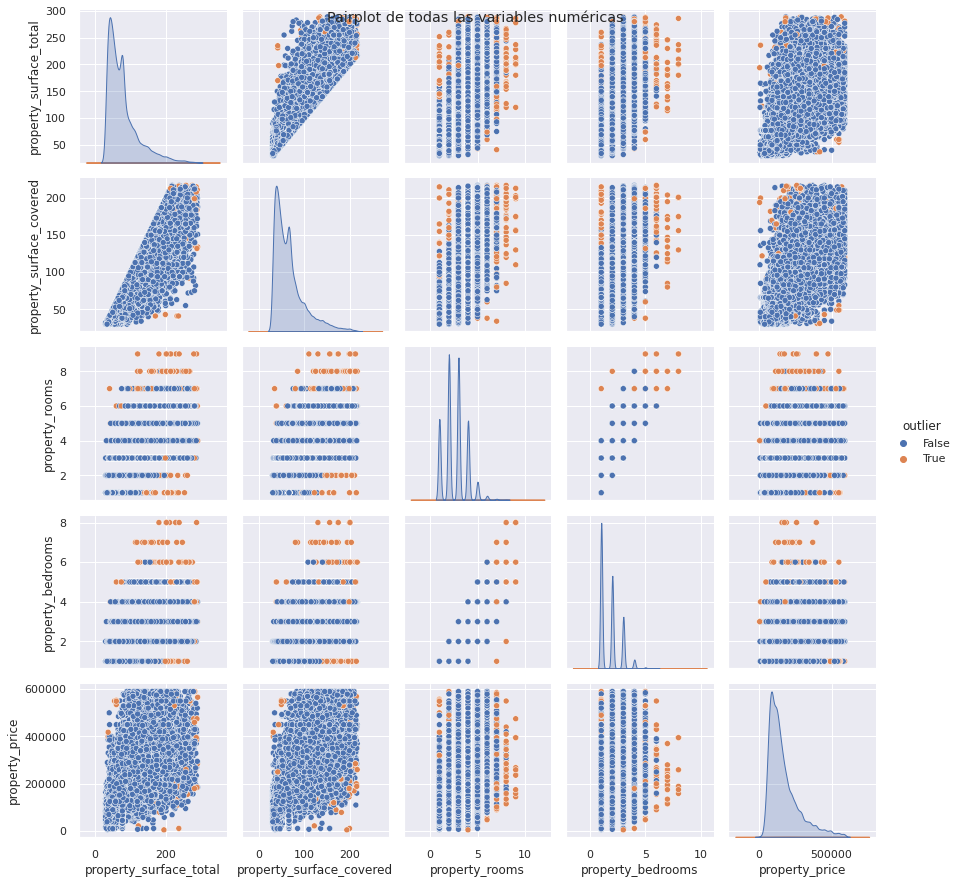

In [54]:
g = sns.pairplot(data=dataset_isolation_forest, hue="outlier")
g.fig.suptitle("Pairplot de todas las variables numéricas")

Luego graficamos el árbol que se creó para la detección de outliers.

In [55]:
estimator = iforest.estimators_[5]

export_graphviz(
    estimator,
    out_file="tree.dot",
    max_depth=5,
    feature_names=columnas,
    special_characters=True,
    rounded=True,
    precision=2,
)
call(["dot", "-Tpng", "tree.dot", "-o", "tree.png", "-Gdpi=600"])
Image(filename="tree.png")


Luego de analizar toda la información que genera el `IsolationForest`, concluimos que, si bien el algoritmo reconoce ciertos valores como atípicos, en los gráficos se observa que simplemente son valores grandes, pero no necesariamente son datos anómalos. Por lo tanto, no los quitaremos ya que consideramos que aportan al análisis.

### Isolation Forest para `property_surface_total` y `property_price`

Ahora vamos a analizar la distribución de valores atipicos en únicamente las columnas `property_surface_total` y `property_price`.

Graficamos la distribución de estas variables en un **scatter plot**.

[Text(0, 0.5, 'property price (usd)'),
 Text(0.5, 0, 'property surface total (m^2)'),
 Text(0.5, 1.0, 'Distribución de superficie total vs precio')]

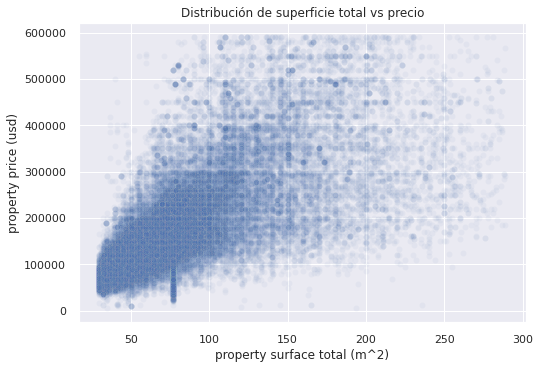

In [56]:
sns.scatterplot(
    data=dataset_train, x="property_surface_total", y="property_price", alpha=0.05
).set(title = "Distribución de superficie total vs precio", xlabel="property surface total (m^2)", ylabel="property price (usd)")


Observamos que hay mucha concentración, con algunas observaciones dispersas. Realizamos otro `isolation forest` para identificarlas. 

Notamos también una concentración de valores entre 50 y 100, lo que seguramente se debe al cambio en la distribución que se observó en la imputación de `property_surface_total`.

In [57]:
columnas = [
    "property_surface_total",
    "property_price",
]

dataset_isolation_forest = dataset_train[columnas].copy()
n_samples = dataset_isolation_forest.shape[0] // 4

iforest = IsolationForest(
    n_estimators=100,
    max_samples=n_samples,
    contamination=0.005,
    max_features=len(columnas),
    bootstrap=True,
    n_jobs=-1,
    random_state=SEMILLA,
)

dataset_isolation_forest["outlier"] = iforest.fit_predict(dataset_isolation_forest)
dataset_isolation_forest["outlier"] = dataset_isolation_forest["outlier"].replace(
    to_replace=[-1, 1], value=[True, False]
)

print("Cantidad de observaciones anómalas:")
print(dataset_isolation_forest["outlier"].value_counts())


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Cantidad de observaciones anómalas:
False    69098
True       348
Name: outlier, dtype: int64


In [58]:
estimator = iforest.estimators_[5]

export_graphviz(
    estimator,
    out_file="tree.dot",
    max_depth=5,
    feature_names=columnas,
    special_characters=True,
    rounded=True,
    precision=2,
)
call(["dot", "-Tpng", "tree.dot", "-o", "tree.png", "-Gdpi=600"])
Image(filename="tree.png")


Graficamos la distribución de outliers encontrada.

[Text(0, 0.5, 'property price (usd)'),
 Text(0.5, 0, 'property surface total (m^2)'),
 Text(0.5, 1.0, 'Distribución de superficie total vs precio')]

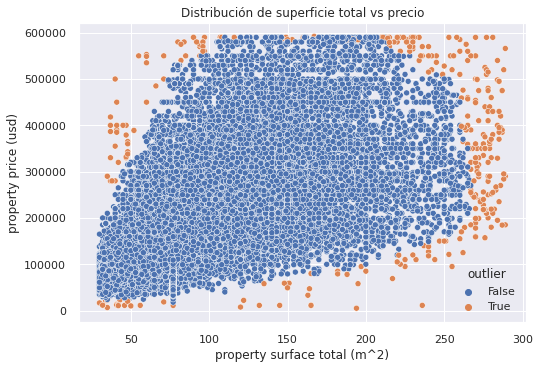

In [59]:
sns.scatterplot(
    data=dataset_isolation_forest,
    x="property_surface_total",
    y="property_price",
    hue="outlier",
).set(title = "Distribución de superficie total vs precio", xlabel="property surface total (m^2)", ylabel="property price (usd)")

Observamos que marca pocos valores que en el gráfico se aprecian como atípicos (por ejemplo, `property_surface_total` alto con `property_price` bajo) por lo que los quitamos para continuar el análisis.

In [60]:
dataset_train = dataset_train[~dataset_isolation_forest.outlier]


Observamos la forma de nuestro `dataset_train`, luego del preprocesamiento. Luego de las imputaciones y eliminación de los outliers y datos faltantes que no se pudieron imputar tenemos el dataset que se utilizará para entrenar modelos y realizar predicciones.

In [61]:
dataset_train.shape


(69098, 9)

Exportamos los datasets luego de aplicar el preprocesamiento de datos.

In [62]:
dataset_train_procesado = dataset_train.copy()
dataset_train_procesado.to_csv("DatasetTrainProcesado.csv")

dataset_test_procesado = dataset_test.copy()
dataset_test_procesado.to_csv("DatasetTestProcesado.csv")

print("EXPORTADO!")


EXPORTADO!


## Reducción de Dimensionalidad

Para la reducción de la dimensionalidad usaremos el método de PCA ya que esta técnica permite hallar las combinaciones lineales de las variables originales que maximizan la variabilidad, es decir, minimizan la pérdida de información original.

Primero, transformamos el dataset en un dataset con variables numéricas, normalizamos los atributos y escalamos las variables.

In [63]:
columnas = [
    "property_surface_total",
    "property_surface_covered",
    "property_rooms",
    "property_bedrooms",
    "latitud",
    "longitud",
]

dataset_pca = dataset_train[columnas].copy()

dataset_pca_test = dataset_test[columnas].copy()

x = dataset_pca.values
scaler = StandardScaler().fit(x)
x = scaler.transform(x)

x_test = dataset_pca_test.values
x_test = scaler.transform(x_test)


Luego, le aplicamos el algoritmo de PCA.

In [64]:
cantidad_componentes = len(dataset_pca.columns)

pca = PCA(n_components=cantidad_componentes)
x_transformada = pca.fit_transform(x)
x_transformada_test = pca.transform(x_test)

componentes_caracteristicos = [f"cp_{n}" for n in range(cantidad_componentes)]

dataset_pca_transformado = pd.DataFrame(
    data=x_transformada, columns=componentes_caracteristicos
)
dataset_pca_transformado_test = pd.DataFrame(
    data=x_transformada_test, columns=componentes_caracteristicos
)

print(cantidad_componentes)


6


Graficamos la variabilidad explicada en relación a la cantidad de componentes principales en un **scree plot**.

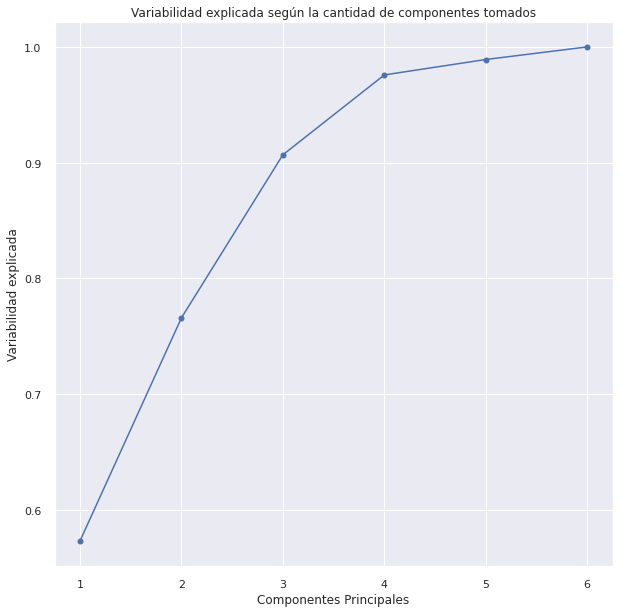

In [65]:
varianza_explicada = pca.explained_variance_ratio_
list_x = list(range(1, len(varianza_explicada) + 1))

plt.figure(figsize=(10, 10))
plt.plot(list_x, varianza_explicada.cumsum(), "-o")
plt.xlabel(r"Componentes Principales")
plt.ylabel("Variabilidad explicada")
plt.title("Variabilidad explicada según la cantidad de componentes tomados")
plt.show()


In [66]:
n_componentes_elegido = 4
print(
    f"La variabilidad explicada tomando {n_componentes_elegido} componentes principales es {varianza_explicada[:n_componentes_elegido].sum()}"
)


La variabilidad explicada tomando 4 componentes principales es 0.9757912007570853


Por lo tanto, concluimos que nos podemos quedar con 4 componentes principales, sin perder mucha variabilidad en los datos.

In [67]:
columnas_a_agregar = ["barrio", "property_type", "property_price"]

dataset_pca_transformado = dataset_pca_transformado.iloc[:, :n_componentes_elegido]
dataset_pca_transformado_test = dataset_pca_transformado_test.iloc[
    :, :n_componentes_elegido
]

In [68]:

dataset_concatenado = pd.concat(
    [
        dataset_pca_transformado.reset_index(drop=True),
        dataset_train[columnas_a_agregar].reset_index(drop=True),
    ],
    axis=1,
    join="inner",
)

dataset_concatenado_test = pd.concat(
    [
        dataset_pca_transformado_test.reset_index(drop=True),
        dataset_test[columnas_a_agregar].reset_index(drop=True),
    ],
    axis=1,
    join="inner",
)
dataset_concatenado.head()

,cp_0,cp_1,cp_2,cp_3,barrio,property_type,property_price
0,-1.061187,-1.471460,-0.787814,0.284561,Belgrano,departamento,178000
1,0.305660,1.823284,-0.879672,-0.301257,Monserrat,departamento,129000
2,-0.814664,-0.575432,-0.803156,0.578697,Palermo,departamento,249000
3,1.758458,0.685552,-0.634864,-0.874827,Barrio Norte,departamento,165000
4,-2.137637,0.297205,-0.460874,0.152659,Palermo,departamento,105000


Exportamos el nuevo dataset reducido.

In [69]:
dataset_reducido_train = dataset_concatenado.copy()
dataset_reducido_train.to_csv("DatasetReducidoTrain.csv")

dataset_reducido_test = dataset_concatenado_test.copy()
dataset_reducido_test.to_csv("DatasetReducidoTest.csv")

print("EXPORTADO!")


EXPORTADO!


# 2. Agrupamiento

Primero vamos a realizar un análisis de Hopkins para determinar la tendencia al _clustering_ del dataset, midiendo la probabilidad de que el conjunto de datos dado sea generado por una distribución de datos uniforme. Es decir, prueba la aleatoriedad espacial de los datos y ve cómo se distribuyen en dicho espacio.


In [70]:
dataset_agrupamiento = pd.get_dummies(dataset_train, drop_first=True)

hopkins(dataset_agrupamiento, dataset_agrupamiento.shape[0])


0.021225311461845763

Vemos que la tendencia al agrupamiento es muy alta, por lo que utilizamos el **elbow method** para buscar qué número de grupos brinda el mejor agrupamiento.

### Elbow Method

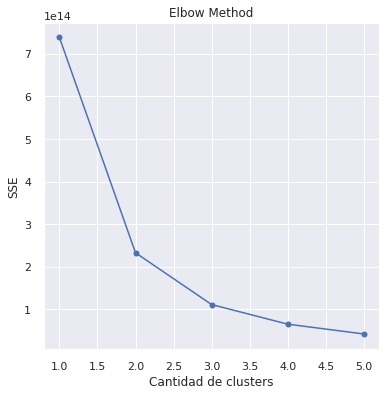

In [71]:
sse = []
list_k = list(range(1, 6))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(dataset_agrupamiento)
    sse.append(km.inertia_)

plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, "-o")
plt.xlabel(r"Cantidad de clusters")
plt.ylabel("SSE")
plt.title("Elbow Method")
plt.show()


Siguiendo la regla del codo, elegimos $k=2$ ya que el codo se quiebra en ese punto. Ahora vamos a aplicar la tecnica de Silhoute para evaluar la calidad de los clusters.

### Silhouette

In [72]:
list_k = list(range(2, 6))

for n_clusters in list_k:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(dataset_agrupamiento)

    score = silhouette_score (dataset_agrupamiento, preds)
    print ("Para n_clusters =" + str(n_clusters) + " el silhouette score es " + str(score))


Para n_clusters =2 el silhouette score es 0.6757767388697662
Para n_clusters =3 el silhouette score es 0.6009059296087103
Para n_clusters =4 el silhouette score es 0.5684792993304856
Para n_clusters =5 el silhouette score es 0.5603515968888458


Podemos observar que el mejor score se obtiene con $2$ clusters, dado que es el valor más cercano a $1$, y graficamos su **silhouette** para poder verlo gráficamente. 

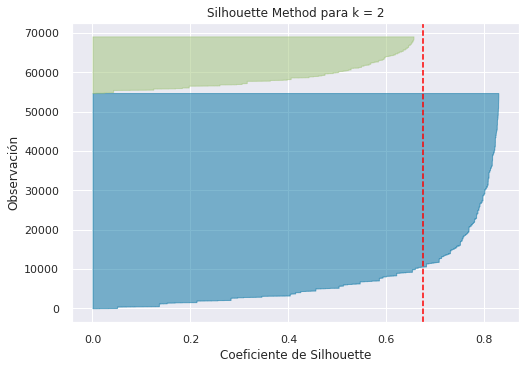

In [73]:
model = KMeans(2, random_state = SEMILLA)

visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(dataset_agrupamiento)
plt.xlabel("Coeficiente de Silhouette")
plt.ylabel("Observación")
plt.title("Silhouette Method para k = 2")
plt.show()


### Gráfico de Clusters con $k=2$

Agregamos una columna al dataset con la información sobre a qué cluster pertenece.

In [74]:
model = KMeans(2, random_state=SEMILLA)
model.fit(dataset_agrupamiento)

dataset_agrupamiento["cluster"] = model.predict(dataset_agrupamiento)
color_map = {0: "red", 1: "blue"}
dataset_agrupamiento.head()


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,barrio_Agronomía,barrio_Almagro,barrio_Balvanera,...,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_departamento,property_type_ph,cluster
83944,-34.554271,-58.457668,2,1,59,59,178000,0,0,0,...,0,0,0,0,0,0,0,1,0,0
195386,-34.613544,-58.368072,3,2,71,71,129000,0,0,0,...,0,0,0,0,0,0,0,1,0,0
293157,-34.571020,-58.433125,2,1,79,59,249000,0,0,0,...,0,0,0,0,0,0,0,1,0,1
384577,-34.597384,-58.405139,4,3,91,85,165000,0,0,0,...,0,0,0,0,0,0,0,1,0,0
450142,-34.591646,-58.418064,1,1,37,32,105000,0,0,0,...,0,0,0,0,0,0,0,1,0,0


Exportamos el modelo KMeans.

In [75]:
dump(model, "KMeans2Clusters.joblib")


['KMeans2Clusters.joblib']

Graficamos sobre un mapa de CABA las propiedades coloreadas según al grupo al que pertenecen.

In [76]:
dataset_agrupamiento.shape


(69098, 66)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


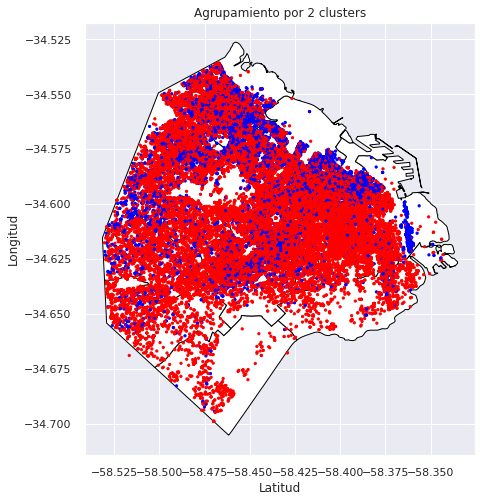

In [78]:
color_map = {0: "red", 1: "blue"}
graficar_mapa_caba(
    dataset_agrupamiento, color_map, "cluster", "Agrupamiento por 2 clusters"
)


Al analizar que los datos se agrupan en $2$ grupos podemos suponer que el agrupamiento se realiza a partir de la variable `property_type`, que puede tomar 3 valores: Casa, Departamento y PH. Este último comparte características con los primeros dos, por lo que tiene sentido que el algoritmo clasifique algunos PH como Casa y otros como Departamento.

Graficamos el mapa ordenando según el tipo de propiedad para comparar.

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


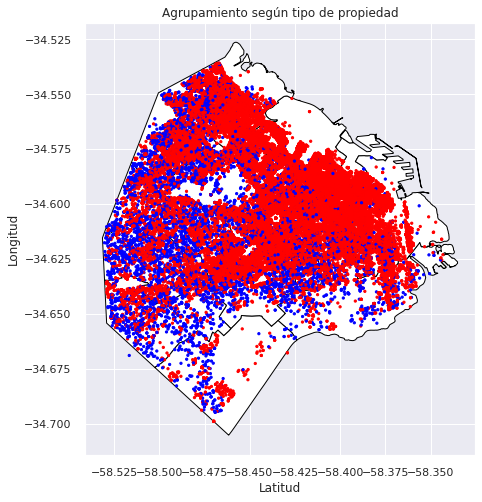

In [79]:
color_map = {"casa": "blue", "ph": "blue", "departamento": "red"}
graficar_mapa_caba(
    dataset_train,
    color_map,
    "property_type",
    "Agrupamiento según tipo de propiedad",
)


Vemos que no encontramos muchas similitudes, por lo que otra suposición es que se agrupan según el precio de la propiedad. Este análisis lo vamos a profundizar más adelante.

### Clusters con $k=3$

Repetimos el análisis con $k=3$, dado que es el segundo valor con mayor silhouette score después de $k=2$.

In [80]:
model = KMeans(3, random_state=SEMILLA)
model.fit(dataset_agrupamiento)

dataset_agrupamiento["cluster_v2"] = model.predict(dataset_agrupamiento)
dataset_agrupamiento.head()


,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,barrio_Agronomía,barrio_Almagro,barrio_Balvanera,...,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_departamento,property_type_ph,cluster,cluster_v2
83944,-34.554271,-58.457668,2,1,59,59,178000,0,0,0,...,0,0,0,0,0,0,1,0,0,2
195386,-34.613544,-58.368072,3,2,71,71,129000,0,0,0,...,0,0,0,0,0,0,1,0,0,1
293157,-34.571020,-58.433125,2,1,79,59,249000,0,0,0,...,0,0,0,0,0,0,1,0,1,2
384577,-34.597384,-58.405139,4,3,91,85,165000,0,0,0,...,0,0,0,0,0,0,1,0,0,2
450142,-34.591646,-58.418064,1,1,37,32,105000,0,0,0,...,0,0,0,0,0,0,1,0,0,1


Realizamos el gráfico silhouette para ver el agrupamiento.

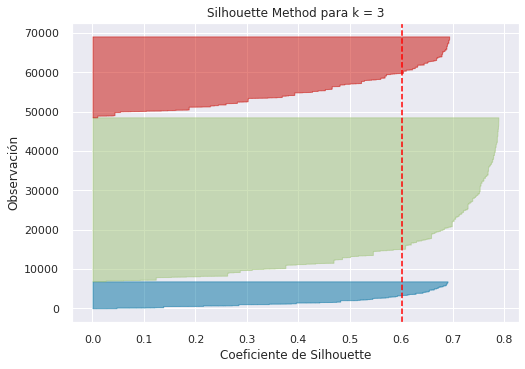

In [81]:
model = KMeans(3, random_state=SEMILLA)

visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
visualizer.fit(dataset_agrupamiento)
plt.xlabel("Coeficiente de Silhouette")
plt.ylabel("Observación")
plt.title("Silhouette Method para k = 3")
plt.show()


Exportamos KMeans con k = 3

In [82]:
dump(model, "KMeans3Clusters.joblib")


['KMeans3Clusters.joblib']

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


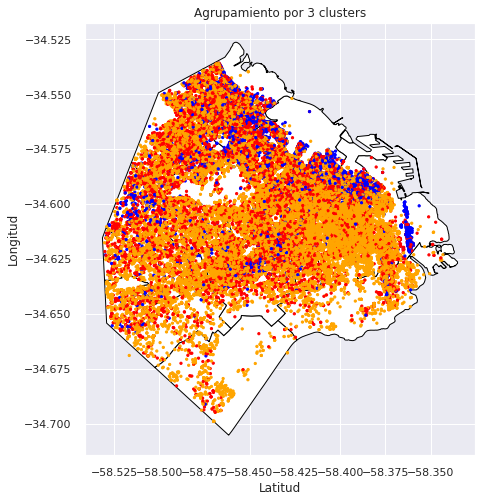

In [83]:
color_map = {0: "blue", 1: "orange", 2: "red"}
graficar_mapa_caba(
    dataset_agrupamiento, color_map, "cluster_v2", "Agrupamiento por 3 clusters"
)


Nuevamente, las agrupaciones no se parecen a las del tipo de propiedad, por lo que podemos suponer de nuevo que se agruparon según el precio de la propieadad.

Finalmente, exportamos el dataset generado con la información de los clusters.

In [84]:
agrupamiento = dataset_agrupamiento.copy()
agrupamiento.to_csv("DatasetAgrupamiento.csv")

print("EXPORTADO!")


EXPORTADO!


# 3. Clasificación

## Construcción del Target

Creamos la variable `pxm2` (precio por metro cuadrado) para luego utilizarla en el análisis de clasificación. 

In [85]:
dataset_clasificacion = dataset_train.copy()
dataset_clasificacion["pxm2"] = (
    dataset_clasificacion.property_price / dataset_clasificacion.property_surface_total
)

dataset_clasificacion_test = dataset_test.copy()
dataset_clasificacion_test["pxm2"] = (
    dataset_clasificacion_test.property_price
    / dataset_clasificacion_test.property_surface_total
)



Graficamos la distribución del precio por metro cuadrado.

[Text(0, 0.5, 'distribución'),
 Text(0.5, 0, 'precio (usd)'),
 Text(0.5, 1.0, 'Distribución de precio por metro cuadrado')]

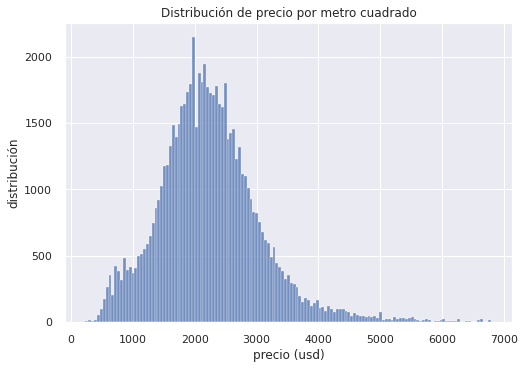

In [86]:
ax = sns.histplot(x=dataset_clasificacion["pxm2"])
ax.set(
    title="Distribución de precio por metro cuadrado",
    xlabel="precio (usd)",
    ylabel="distribución",
)


Ahora graficamos la distribución del precio por metro cuadrado por tipo de propiedad.

[Text(0, 0.5, 'distribución'),
 Text(0.5, 0, 'precio (usd)'),
 Text(0.5, 1.0, 'Distribución de precio por metro cuadrado')]

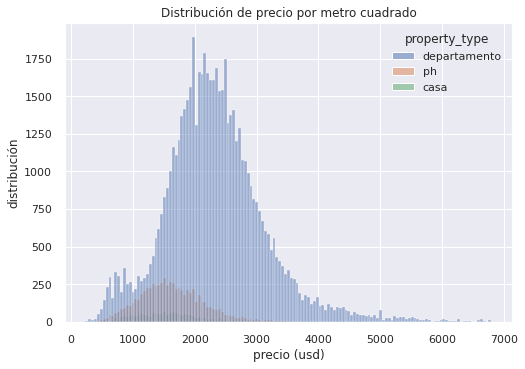

In [87]:
ax = sns.histplot(
    data=dataset_clasificacion, x=dataset_clasificacion["pxm2"], hue="property_type"
)
ax.set(
    title="Distribución de precio por metro cuadrado",
    xlabel="precio (usd)",
    ylabel="distribución",
)


Creamos tres columnas de `tipo_precio` utilizando las 3 alternativas propuestas y luego analizamos la distribución de la nueva variable creada.

#### Alternativa 1

In [88]:
labels = ["bajo", "medio", "alto"]

dataset_clasificacion["tipo_precio_1"] = pd.qcut(
    dataset_clasificacion["pxm2"], q=[0, 1 / 3, 2 / 3, 1], labels=labels
)
dataset_clasificacion_test["tipo_precio_1"] = pd.qcut(
    dataset_clasificacion["pxm2"], q=[0, 1 / 3, 2 / 3, 1], labels=labels
)


[Text(0, 0.5, 'frecuencia'),
 Text(0.5, 0, 'tipo de precio'),
 Text(0.5, 1.0, 'Distribución del tipo de precio')]

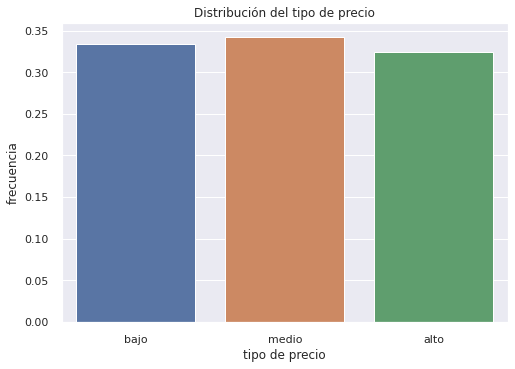

In [89]:
frecuencia_relativa = obtener_frecuencia_relativa(
    dataset_clasificacion["tipo_precio_1"]
)
ax = sns.barplot(x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(
    title="Distribución del tipo de precio",
    xlabel="tipo de precio",
    ylabel="frecuencia",
)


#### Alternativa 2

In [90]:
dataset_clasificacion["tipo_precio_2"] = pd.qcut(
    dataset_clasificacion["pxm2"], q=[0, 0.25, 0.75, 1], labels=labels
)


[Text(0, 0.5, 'frecuencia'),
 Text(0.5, 0, 'tipo de precio'),
 Text(0.5, 1.0, 'Distribución del tipo de precio')]

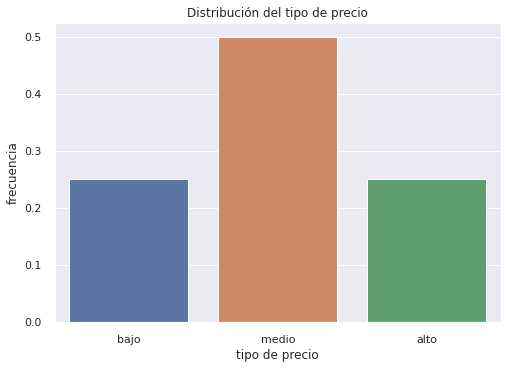

In [91]:
frecuencia_relativa = obtener_frecuencia_relativa(
    dataset_clasificacion["tipo_precio_2"]
)
ax = sns.barplot(x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(
    title="Distribución del tipo de precio",
    xlabel="tipo de precio",
    ylabel="frecuencia",
)


#### Alternativa 3

In [92]:
def establecer_limites_categorias(dataset_clasificacion):

    dataset_ph = dataset_clasificacion[
        dataset_clasificacion.property_type == "ph"
    ].copy()
    dataset_ph["tipo_precio_3"] = pd.qcut(
        dataset_ph["pxm2"], q=[0, 0.25, 0.75, 1], labels=labels
    )

    dataset_dep = dataset_clasificacion[
        dataset_clasificacion.property_type == "departamento"
    ].copy()
    dataset_dep["tipo_precio_3"] = pd.qcut(
        dataset_dep["pxm2"], q=[0, 0.25, 0.75, 1], labels=labels
    )

    dataset_casa = dataset_clasificacion[
        dataset_clasificacion.property_type == "casa"
    ].copy()
    dataset_casa["tipo_precio_3"] = pd.qcut(
        dataset_casa["pxm2"], q=[0, 0.25, 0.75, 1], labels=labels
    )

    dataset_clasificacion = pd.concat(
        [
            dataset_ph.reset_index(drop=True),
            dataset_dep.reset_index(drop=True),
            dataset_casa.reset_index(drop=True),
        ],
        axis=0,
    )

    return dataset_clasificacion


dataset_clasificacion = establecer_limites_categorias(dataset_clasificacion)


[Text(0, 0.5, 'frecuencia'),
 Text(0.5, 0, 'tipo de precio'),
 Text(0.5, 1.0, 'Distribución del tipo de precio')]

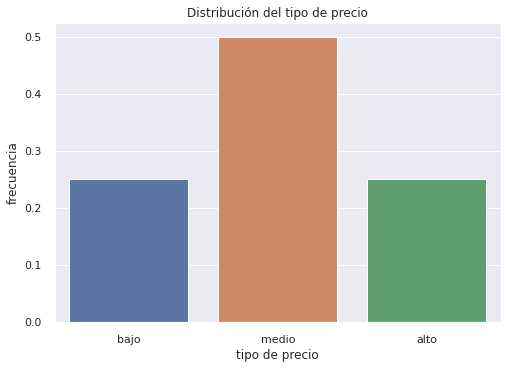

In [93]:
frecuencia_relativa = obtener_frecuencia_relativa(
    dataset_clasificacion["tipo_precio_3"]
)
ax = sns.barplot(x=frecuencia_relativa.index, y=frecuencia_relativa.values)
ax.set(
    title="Distribución del tipo de precio",
    xlabel="tipo de precio",
    ylabel="frecuencia",
)


Exportamos el dataset de clasificación con las tres alternativas

In [94]:
clasificacion = dataset_clasificacion.copy()
clasificacion.to_csv("DatasetClasificacionTresAlternativas.csv")

print("EXPORTADO")


EXPORTADO


Elegimos la primera alternativa ya que los modelos se entrenan mejor si tienen un dataset balanceado.  

In [95]:
alternativas_a_quitar = ["tipo_precio_2", "tipo_precio_3"]
dataset_clasificacion.drop(alternativas_a_quitar, axis=1, inplace=True)

dataset_clasificacion.rename(columns={"tipo_precio_1": "tipo_precio"}, inplace=True)
dataset_clasificacion_test.rename(
    columns={"tipo_precio_1": "tipo_precio"}, inplace=True
)


A partir del target de entrenamiento, creamos el target para los datos de test, estableciendo umbrales según los precios estén catalogados como bajo, medio o alto.

In [96]:
umbral_precio_bajo = dataset_clasificacion[
    dataset_clasificacion.tipo_precio == "bajo"
].pxm2.max()
umbral_precio_medio = dataset_clasificacion[
    dataset_clasificacion.tipo_precio == "medio"
].pxm2.max()


def establecer_target(fila, umbral_precio_bajo, umbral_precio_medio):
    if fila["pxm2"] <= umbral_precio_bajo:
        fila["tipo_precio"] = "bajo"
    elif (fila["pxm2"] > umbral_precio_bajo) and (fila["pxm2"] <= umbral_precio_medio):
        fila["tipo_precio"] = "medio"
    else:
        fila["tipo_precio"] = "alto"
    return fila


dataset_clasificacion_test = dataset_clasificacion_test.apply(
    establecer_target, args=(umbral_precio_bajo, umbral_precio_medio), axis=1
)


## Análisis del Target

Graficamos un mapa de CABA con los avisos coloreados por el tipo de precio

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


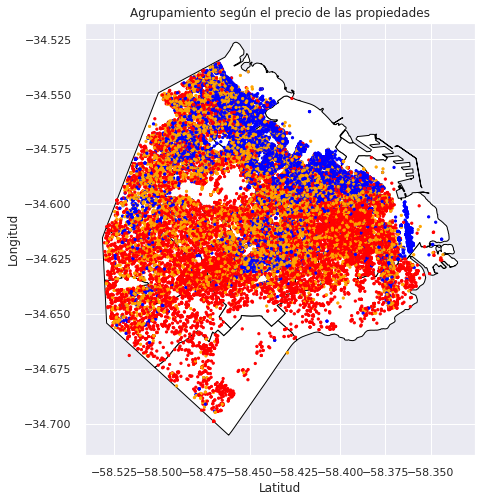

In [97]:
color_map = {"alto": "blue", "medio": "orange", "bajo": "red"}
graficar_mapa_caba(
    dataset_clasificacion,
    color_map,
    "tipo_precio",
    "Agrupamiento según el precio de las propiedades",
)


Luego de analizar este gráfico y el realizado para KMeans con 3 clusters notamos que los agrupamientos son muy similares. Esto implica que a pesar de no tener la variable `pxm2` KMeans reconoció que esas propiedades debían ir agrupadas por sus otras características.

## Entrenamiento y Predicción

### Preparación del dataset

Realizamos el modelo para el dataset de clasificación con las columnas originales.

In [98]:
dataset_entrenamiento = dataset_clasificacion.copy()
dataset_entrenamiento_test = dataset_clasificacion_test.copy()

target_train = dataset_clasificacion["tipo_precio"]
target_test = dataset_clasificacion_test["tipo_precio"]

precios_train = dataset_clasificacion["property_price"]
clasificacion_train = eliminar_columnas(
    dataset_entrenamiento, ["pxm2", "property_price", "tipo_precio"]
)
clasificacion_train = pd.get_dummies(
    dataset_entrenamiento, columns=["barrio", "property_type"], drop_first=True
)

precios_test = dataset_clasificacion_test["property_price"]
clasificacion_test = eliminar_columnas(
    dataset_entrenamiento_test, ["pxm2", "property_price", "tipo_precio"]
)
clasificacion_test = pd.get_dummies(
    dataset_entrenamiento_test, columns=["barrio", "property_type"], drop_first=True
)


Nos aseguramos que los datos de entrenamiento y de test contengan las mismas columnas en el mismo orden.

In [99]:
def insertar_columnas_faltantes(dataset_train, dataset_test):
    for (i, columna) in enumerate(dataset_train.columns):
        if not columna in dataset_test.columns.unique():
            dataset_test.insert(i, columna, 0)


insertar_columnas_faltantes(clasificacion_train, clasificacion_test)


Preparamos también el dataset reducido.

In [100]:
dataset_entrenamiento_reducido = dataset_concatenado.copy()
dataset_entrenamiento_reducido_test = dataset_concatenado_test.copy()

clasificacion_reducido_train = pd.get_dummies(
    dataset_entrenamiento_reducido, columns=["barrio", "property_type"], drop_first=True
)
clasificacion_reducido_test = pd.get_dummies(
    dataset_entrenamiento_reducido_test,
    columns=["barrio", "property_type"],
    drop_first=True,
)

insertar_columnas_faltantes(clasificacion_reducido_train, clasificacion_reducido_test)


Exportamos los datasets que se van a utilizar para entrenar los modelos de clasificación.

In [101]:
dataset_train_clasificacion = clasificacion_train.copy()
dataset_test_clasificacion = clasificacion_test.copy()

dataset_train_clasificacion_reducido = clasificacion_reducido_train.copy()
dataset_test_clasificacion_reducido = clasificacion_reducido_test.copy()

dataset_train_clasificacion.to_csv("DatasetTrainClasificacion.csv")
dataset_test_clasificacion.to_csv("DatasetTestClasificacion.csv")
dataset_train_clasificacion_reducido.to_csv("DatasetTrainClasificacionReducido.csv")
dataset_test_clasificacion_reducido.to_csv("DatasetTestClasificacionReducido.csv")

print("EXPORTADO!")


EXPORTADO!


### Modelo 1: Árbol de decisión

Buscamos los mejores hiperparámetros para el modelo mediante k-fold CrossValidation para obtener la mejor performance. 

Decidimos buscar hiperparámetros que optimizaran `accuracy` ya que nos pareció la métrica más adecuada.

Realizamos 20 iteraciones para buscar los mejores hiperparámetros, y dividimos el dataset en 5 folds para el Cross Validation. Elegimos usar 5 ya que nos pareció que es una cantidad razonable de subconjuntos. 

In [102]:
n_combinations = 20

params = {
    "criterion": ["gini", "entropy"],
    "min_samples_leaf": list(range(1, 10)),
    "ccp_alpha": np.linspace(0, 0.05, n_combinations),
    "max_depth": list(range(1, 1000)),
    'random_state': [SEMILLA]
}

folds = 5


In [103]:
kfoldcv = StratifiedKFold(n_splits=folds)

base_tree = DecisionTreeClassifier()

score = make_scorer(sk.metrics.accuracy_score)

randomcv = RandomizedSearchCV(
    estimator=base_tree,
    param_distributions=params,
    scoring=score,
    cv=kfoldcv,
    n_iter=n_combinations,
    random_state=SEMILLA
)

randomcv.fit(X=clasificacion_train, y=target_train)

model = base_tree.fit(X=clasificacion_train, y=target_train)


Luego, imprimimos los mejores hiperparámetros que se encontraron y la mejor métrica.

In [104]:
print("Mejores hiperparámetros: ", randomcv.best_params_)
print("Mejor métrica: ", randomcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'min_samples_leaf': 8, 'max_depth': 900, 'criterion': 'entropy', 'ccp_alpha': 0.0}
Mejor métrica:  0.6483979418005935


Entrenamos el modelo y luego predecimos los valores con el dataset de test. También lo exportamos.

In [105]:
tree_model = randomcv.best_estimator_

model = tree_model.fit(X=clasificacion_train, y=target_train)


Ahora comparamos con los datos de entrenamiento para analizar el comportamiento del modelo. Son buenas métricas en relación al conjunto de test, por lo que no hay overfitting.

In [106]:
imprimir_metricas_clasificacion(target_train, model.predict(clasificacion_train))

Accuracy: 0.7917595299429795
Recall: 0.7917595299429795
F1 score: 0.790928381814116


In [107]:
dump(model, "arbolDeDecision.joblib")


['arbolDeDecision.joblib']

In [108]:
tipo_de_precio_pred = model.predict(clasificacion_test)


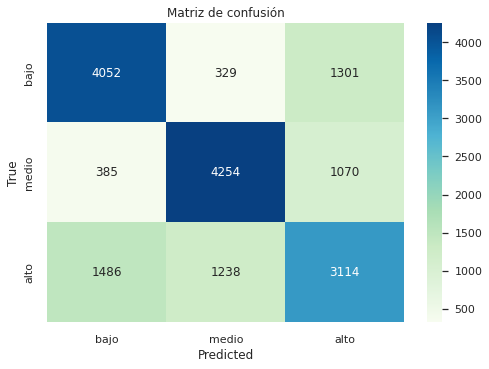

Accuracy: 0.6628359161878229
Recall: 0.6628359161878229
F1 score: 0.6611881403418898


In [109]:
plot_confusion_matrix(target_test, tipo_de_precio_pred, labels)
imprimir_metricas_clasificacion(target_test, tipo_de_precio_pred)


Observamos que la clasificación fue exitosa. Las propiedades con tipo de precio `bajo` y `medio` son las que fueron mejor clasificadas.

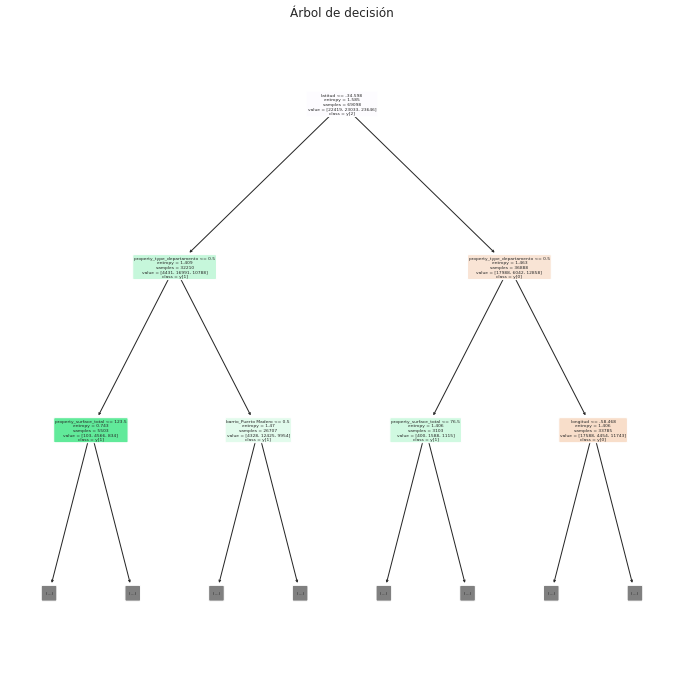

In [110]:
plt.figure(figsize=(12, 12))

tree_plot = tree.plot_tree(
    model,
    max_depth=2,
    feature_names=clasificacion_train.columns.to_list(),
    filled=True,
    rounded=True,
    class_names=True,
)
plt.title("Árbol de decisión")
plt.show(tree_plot)


Como podemos observar, el árbol primero pregunta si la latitud de la muestra es menor que -34.599. Si esto se cumple, entonces averigua si el tipo de propiedad es un departamento. 

Luego, se generan 4 subramas: en una se pregunta por la superficie total, en otra si es el barrio Puerto Madero, en otra de nuevo por la superficie total y finalmente por la longitud.

Así sigue generando las ramas hasta que termina de clasificar todas las observaciones.

Ahora entrenamos el mismo modelo pero con el dataset reducido. Utilizamos el target generado con el dataset previo y seguimos los mismos pasos.

In [111]:
n_combinations = 20

params = {
    "criterion": ["gini", "entropy"],
    "min_samples_leaf": list(range(20, 100)),
    "ccp_alpha": np.linspace(0, 0.05, n_combinations),
    "max_depth": list(range(500, 1000)),
    'random_state': [SEMILLA]
}

folds = 5

In [112]:
kfoldcv = StratifiedKFold(n_splits=folds)

base_tree = DecisionTreeClassifier()

score = make_scorer(sk.metrics.accuracy_score)

randomcv = RandomizedSearchCV(
    estimator=base_tree,
    param_distributions=params,
    scoring=score,
    cv=kfoldcv,
    n_iter=n_combinations,
    random_state=SEMILLA,
)

randomcv.fit(X=clasificacion_reducido_train, y=target_train)


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=DecisionTreeClassifier(), n_iter=20,
                   param_distributions={'ccp_alpha': array([0.        , 0.00263158, 0.00526316, 0.00789474, 0.01052632,
       0.01315789, 0.01578947, 0.01842105, 0.02105263, 0.02368421,
       0.02631579, 0.02894737, 0.03157895, 0.03421053, 0.03684211,
       0.03947368, 0.04210526, 0.04...
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [500, 501, 502, 503, 504,
                                                      505, 506, 507, 508, 509,
                                                      510, 511, 512, 513, 514,
                                                      515, 516, 517, 518, 519,
                                                      520, 521, 522, 523, 524,
                                                      525, 526, 527, 528, 529, ...],
  

In [113]:
print("Mejores hiperparámetros: ", randomcv.best_params_)
print("Mejor métrica: ", randomcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'min_samples_leaf': 51, 'max_depth': 821, 'criterion': 'entropy', 'ccp_alpha': 0.007894736842105263}
Mejor métrica:  0.34220961534010774


In [114]:
tree_model = randomcv.best_estimator_
model = tree_model.fit(X=clasificacion_reducido_train, y=target_train)


In [115]:
dump(model, "arbolDeDecisionReducido.joblib")


['arbolDeDecisionReducido.joblib']

In [116]:
tipo_de_precio_pred = model.predict(clasificacion_reducido_test)


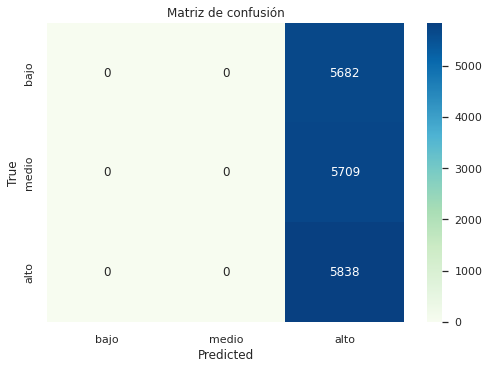

Accuracy: 0.33884729235591154
Recall: 0.33884729235591154
F1 score: 0.17151692831957444


In [117]:
plot_confusion_matrix(target_test, tipo_de_precio_pred, labels)
imprimir_metricas_clasificacion(target_test, tipo_de_precio_pred)


Podemos observar que con el dataset reducido las predicciones dieron peores resultados (se clasifica todo como si fuera de la clase alta), lo cual era de esperar dado que la métrica dio muy baja como para dar buenos resultados. Se puede suponer que, si bien los componentes elegidos representaban bien al 98% del dataset original, puede que no se estén respetando bien las columnas o el órden de los datos, haciendo que el modelo entrene mal.

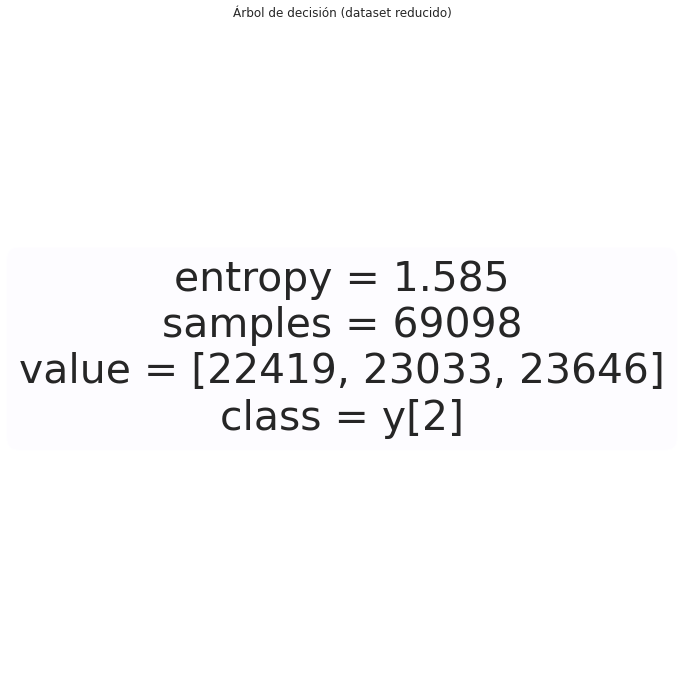

In [118]:
plt.figure(figsize=(12, 12))

tree_plot = tree.plot_tree(
    model,
    max_depth=3,
    feature_names=clasificacion_reducido_train.columns.to_list(),
    filled=True,
    rounded=True,
    class_names=True,
)
plt.title("Árbol de decisión (dataset reducido)")
plt.show(tree_plot)


### Modelo 2: Random Forest

Para la elección de hiperparámetros realizamos un cross validation. 

In [119]:
n_combinations = 5

params = {
    "criterion": ["gini", "entropy"],
    "min_samples_leaf": list(range(1, 10)),
    "min_samples_split": list(range(2, 10)),
    "n_estimators": list(range(50, 100)),
    "random_state": [SEMILLA],
}

folds = 5

kfoldcv = StratifiedKFold(n_splits=folds)

base_tree = RandomForestClassifier()

score = make_scorer(sk.metrics.accuracy_score)

randomcv = RandomizedSearchCV(
    estimator=base_tree,
    param_distributions=params,
    scoring=score,
    cv=kfoldcv,
    n_iter=n_combinations,
    random_state=SEMILLA,
)

model = randomcv.fit(X=clasificacion_train, y=target_train)


In [120]:
print("Mejores hiperparámetros: ", randomcv.best_params_)
print("Mejor métrica: ", randomcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'n_estimators': 81, 'min_samples_split': 4, 'min_samples_leaf': 4, 'criterion': 'entropy'}
Mejor métrica:  0.6795855283875292


Comparamos con las métricas de entrenamiento para ver la performance del modelo y vemos que son buenas en relación al conjunto de test, por lo que el modelo no está haciendo overfitting.

In [121]:
imprimir_metricas_clasificacion(target_train, model.predict(clasificacion_train))

Accuracy: 0.7940895539668297
Recall: 0.7940895539668297
F1 score: 0.7930660990471132


In [122]:
dump(model, "randomForest.joblib")


['randomForest.joblib']

Luego de entrenar al modelo hacemos la matriz de confusión y calculamos las métricas. Vemos que tiene buenos resultados.

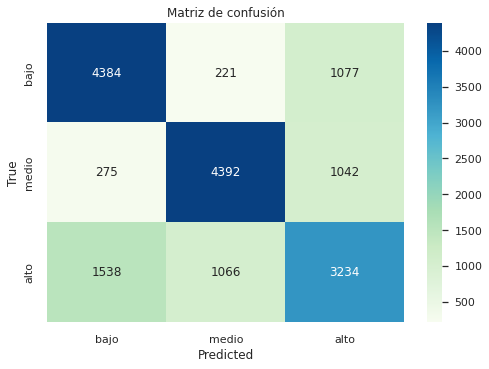

Accuracy: 0.6970805038017296
Recall: 0.6970805038017296
F1 score: 0.6948553783036279


In [123]:
target_pred = model.predict(clasificacion_test)
plot_confusion_matrix(target_test, target_pred, labels)
imprimir_metricas_clasificacion(target_test, target_pred)


Graficamos uno de los árboles del ensamble y observamos sus hiperparámetros.

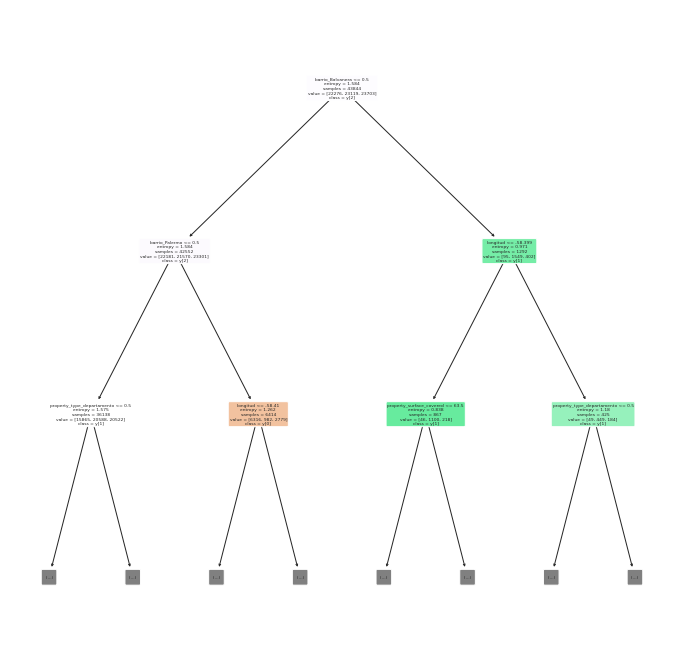

In [124]:
plt.figure(figsize=(12, 12))

sample_tree = model.best_estimator_.estimators_[0]

tree_plot = tree.plot_tree(
    sample_tree,
    max_depth=2,
    feature_names=clasificacion_train.columns.to_list(),
    filled=True,
    rounded=True,
    class_names=True,
)

plt.show(tree_plot)


In [125]:
sample_tree.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 4,
 'min_samples_split': 4,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 209652396,
 'splitter': 'best'}

Ahora repetimos el análisis con el dataset reducido. 

In [126]:
n_combinations = 5

params = {
    "criterion": ["gini", "entropy"],
    "min_samples_leaf": list(range(1, 10)),
    "min_samples_split": list(range(2, 10)),
    "n_estimators": list(range(50, 100)),
    "oob_score": [True],
    "random_state": [SEMILLA],
}

folds = 5

kfoldcv = StratifiedKFold(n_splits=folds)

base_tree = RandomForestClassifier()

score = make_scorer(sk.metrics.accuracy_score)

randomcv = RandomizedSearchCV(
    estimator=base_tree,
    param_distributions=params,
    scoring=score,
    cv=kfoldcv,
    n_iter=n_combinations,
    random_state=SEMILLA,
)

model = randomcv.fit(X=clasificacion_reducido_train, y=target_train)


In [127]:
print("Mejores hiperparámetros: ", randomcv.best_params_)
print("Mejor métrica: ", randomcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'oob_score': True, 'n_estimators': 64, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'gini'}
Mejor métrica:  0.3346261114728154


In [128]:
dump(model, "randomForestReducido.joblib")


['randomForestReducido.joblib']

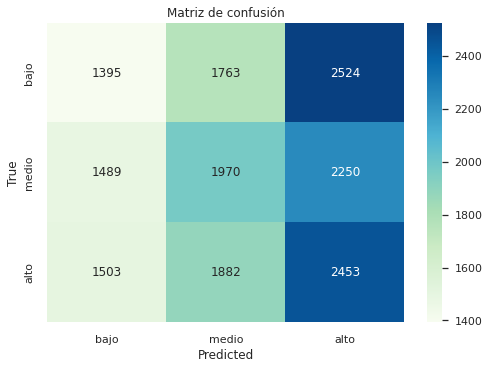

Accuracy: 0.337686458877474
Recall: 0.337686458877474
F1 score: 0.33391245873052783


In [129]:
target_pred = model.predict(clasificacion_reducido_test)

plot_confusion_matrix(target_test, target_pred, labels)
imprimir_metricas_clasificacion(target_test, target_pred)


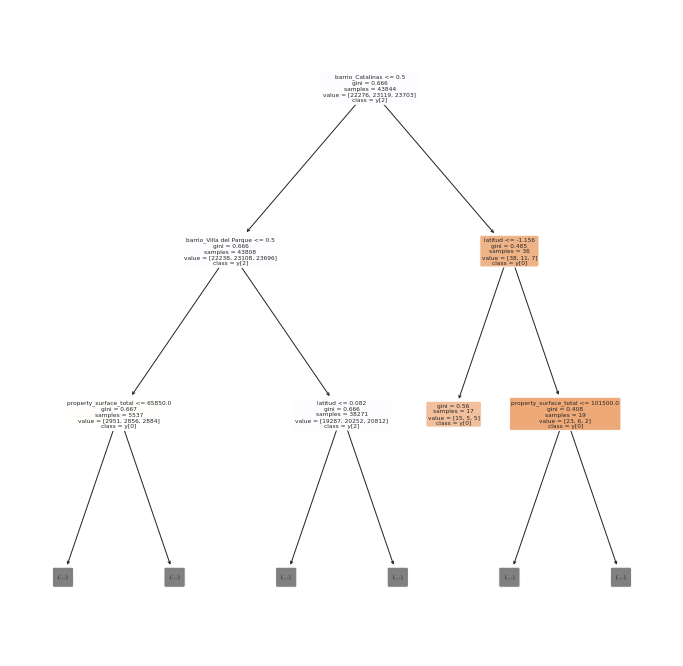

In [130]:
plt.figure(figsize=(12, 12))

tree_plot = tree.plot_tree(
    model.best_estimator_.estimators_[0],
    max_depth=2,
    feature_names=clasificacion_train.columns.to_list(),
    filled=True,
    rounded=True,
    class_names=True,
)

plt.show(tree_plot)


Observamos que nuevamente el modelo entrenado con el dataset no reducido obtuvo mejores resultados. Podemos suponer que el dataset reducido, si bien mantiene los clusters, al modificar los datos puede arruinar las clasificaciones.

### Modelo 3: Regresión Logística con validación cruzada

Decidimos crear un modelo de regresión logística multiclase utilizando validación cruzada. 

In [131]:
x_train = clasificacion_train.values
y_train = target_train.values
x_test = clasificacion_test.values
y_test = target_test.values

x_train_norm = normalizar_estandar(x_train)
x_test_norm = normalizar_estandar(x_test)


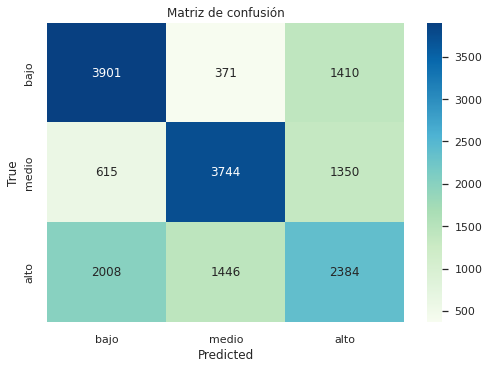

Accuracy: 0.5820999477624935
Recall: 0.5820999477624935
F1 score: 0.578078915770333


In [132]:
modelo_cv = LogisticRegressionCV(cv=5, max_iter=300, multi_class="multinomial")
modelo_cv.fit(x_train_norm, y_train)

y_pred_modelo_cv = modelo_cv.predict(x_test_norm)

plot_confusion_matrix(y_test, y_pred_modelo_cv, labels)
imprimir_metricas_clasificacion(y_test, y_pred_modelo_cv)


Comparamos con las métricas de entrenamiento para ver la performance del modelo.

In [133]:
imprimir_metricas_clasificacion(y_train, modelo_cv.predict(x_train))

Accuracy: 0.3333381573996353
Recall: 0.3333381573996353
F1 score: 0.1666708877443162


In [134]:
dump(modelo_cv, "regresionLogistica.joblib")


['regresionLogistica.joblib']

Repetimos el entrenamiento del tercer modelo con el dataset reducido.

In [135]:
x_train_reducido = clasificacion_reducido_train.values
x_test_reducido = clasificacion_reducido_test.values

x_train_reducido_norm = normalizar_estandar(x_train_reducido)
x_test_reducido_norm = normalizar_estandar(x_test_reducido)


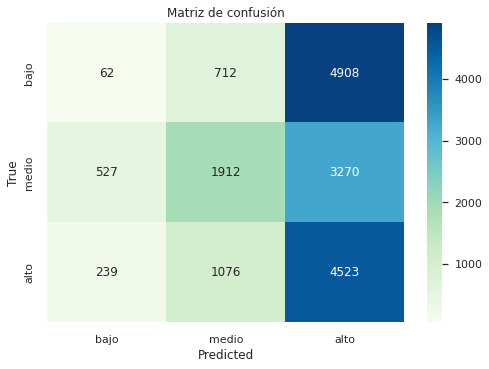

Accuracy: 0.37709675547042776
Recall: 0.37709675547042776
F1 score: 0.3062914773767095


In [136]:
modelo_cv = LogisticRegressionCV(cv=5, max_iter=300)
modelo_cv.fit(x_train_reducido_norm, target_train)

y_pred_reducido_modelo_cv = modelo_cv.predict(x_test_reducido_norm)

plot_confusion_matrix(target_test, y_pred_reducido_modelo_cv, labels)
imprimir_metricas_clasificacion(target_test, y_pred_reducido_modelo_cv)


In [137]:
dump(modelo_cv, "regresionLogisticaReducido.joblib")


['regresionLogisticaReducido.joblib']

### Conclusiones

Luego de entrenar y testear los tres modelos, podemos observar que el que mejor métricas obtuvo fue `RandomForest`. Tiene sentido que haya dado mejor ya que es un ensamble de muchos árboles de decisión, por lo que debería predecir mejor que un solo árbol de decisión. Además, al ser un ensamble de árboles, es un modelo que reduce la varianza. 

Por otro lado, Regresión Logistica es un modelo con alto sesgo, ya que la diferencia entre el valor esperado y el valor predicho es muy alta. A diferencia de los árboles, que tienen muchos hiperparámetros que se eligieron con Random Cross Validation, tiene menos hiperparámetros por lo que puede que no se ajuste correctamente a los datos o le cueste más ajustarse que a los árboles.


## Regresión

### Preparación

Primero preparamos los datasets que se van a utilizar, asegurándonos que tengan las mismas columnas y en el mismo orden.

In [138]:
regresion_train = clasificacion_train
regresion_test = clasificacion_test
target_train = precios_train
target_test = precios_test

regresion_reducido_train = clasificacion_reducido_train
regresion_reducido_test = clasificacion_reducido_test


In [139]:
insertar_columnas_faltantes(regresion_train, regresion_test)


Exportamos los datasets que se van a utilizar para los modelos de regresión.

In [140]:
dataset_train_regresion = regresion_train.copy()
dataset_test_regresion = regresion_test.copy()

dataset_train_regresion_reducido = regresion_reducido_train.copy()
dataset_test_regresion_reducido = regresion_reducido_test.copy()

dataset_train_regresion.to_csv("DatasetTrainRegresion.csv")
dataset_test_regresion.to_csv("DatasetTestRegresion.csv")
dataset_train_regresion_reducido.to_csv("DatasetTrainRegresionReducido.csv")
dataset_test_regresion_reducido.to_csv("DatasetTestRegresionReducido.csv")


El siguiente modelo lineal se utilizará como un punto de comparación con cada uno de los modelos solicitados.

In [141]:
lr_model = LinearRegression().fit(regresion_train, target_train)
precios_predichos_lr = lr_model.predict(regresion_test)

imprimir_metricas_regresion(target_test, precios_predichos_lr)


El error (mse) de test es: 3037900153.2820935
El error (rmse) de test es: 55117.14935736512
El score R2 es: 0.7140244011451109


In [142]:
dump(lr_model, "regresionLinealComparador.joblib")


['regresionLinealComparador.joblib']

### Modelo 1: KNN

Primero usamos RandomizedSearch para hallar los mejores hiperparámetros para el modelo.

In [143]:
knn = KNeighborsRegressor()

param_grid = {'n_neighbors': np.arange(1, 25),
              'weights': ['uniform', 'distance'],}

knn_randcv = RandomizedSearchCV(knn, param_grid, cv=5, random_state=SEMILLA)

knn_randcv.fit(regresion_train, target_train)


RandomizedSearchCV(cv=5, estimator=KNeighborsRegressor(),
                   param_distributions={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                        'weights': ['uniform', 'distance']},
                   random_state=0)

In [144]:
print("Mejores hiperparámetros: ", knn_randcv.best_params_)
print("Mejor métrica: ", knn_randcv.best_score_)


Mejores hiperparámetros:  {'weights': 'distance', 'n_neighbors': 19}
Mejor métrica:  0.7224960223601652


In [145]:
knn_model = knn_randcv.best_estimator_
model = knn_model.fit(X=regresion_train, y=target_train)
precios_predichos_knn = model.predict(regresion_test)


In [146]:
dump(model, "knn.joblib")


['knn.joblib']

Evaluamos la performance del modelo en el conjunto de evaluación y observamos los resultados de las métricas

In [147]:
imprimir_metricas_regresion(target_test, precios_predichos_knn)


El error (mse) de test es: 2224416490.0645814
El error (rmse) de test es: 47163.720061765496
El score R2 es: 0.7906024537502832


Se puede observar en base a las métricas que el modelo de KNN (R2 = 0.791) es superador al de regresión lineal (R2 = 0.714).

Ahora pasaremos a calcular la performance del modelo prediciendo los datos de entrenamiento

In [148]:
precios_predichos_knn_train = model.predict(regresion_train)
imprimir_metricas_regresion(target_train, precios_predichos_knn_train)


El error (mse) de test es: 33645952.280609354
El error (rmse) de test es: 5800.513104942472
El score R2 es: 0.9968525259739959


Comparándola con los resultados de la predicción con el dataset de testing, se puede observar que con el de entrenamiento la métrica da bastante alto, dando índices de overfitting.

Ahora realizamos el mismo procedimiento con el dataset reducido.

In [149]:
knn_red = KNeighborsRegressor()

param_grid = {"n_neighbors": np.arange(1, 25), "weights": ["uniform", "distance"]}

knn_red_randcv = RandomizedSearchCV(knn_red, param_grid, cv=5, random_state=SEMILLA)

knn_red_randcv.fit(regresion_reducido_train, target_train)


RandomizedSearchCV(cv=5, estimator=KNeighborsRegressor(),
                   param_distributions={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                        'weights': ['uniform', 'distance']},
                   random_state=0)

In [150]:
print("Mejores hiperparámetros: ", knn_red_randcv.best_params_)
print("Mejor métrica: ", knn_red_randcv.best_score_)

knn_red_model = knn_red_randcv.best_estimator_
model = knn_red_model.fit(X=regresion_reducido_train, y=target_train)
precios_predichos_knn_red = model.predict(regresion_reducido_test)

imprimir_metricas_regresion(target_test, precios_predichos_knn_red)


Mejores hiperparámetros:  {'weights': 'uniform', 'n_neighbors': 21}
Mejor métrica:  -0.052247087446373054
El error (mse) de test es: 11169552251.76511
El error (rmse) de test es: 105686.10245327959
El score R2 es: -0.05145634582115033


In [151]:
dump(model, "knnReducido.joblib")


['knnReducido.joblib']

De forma similar a como sucedió en la clasificación, utilizando los datos del dataset reducido se obtienen peores resultados que el original, por lo que si bien los componentes elegidos representaban un 98% de la variabilidad de los datos, debe haber información que se pierde.

Otra posibilidad es que el modelo no sepa entrenarse con los datos generados con PCA.

### Modelo 2: XGBoost

XGBoost utiliza la regularización L1 y L2 mejorando las capacidades de generalización del modelo.

In [152]:
xgb = XGBRegressor()

param_grid = {
    "max_depth": [4, 8, 12],
    "learning_rate": [0.03, 0.05, 0.07],
    "min_child_weight": [2, 4, 6],
    "n_estimators": [250, 500],
}

xgb_randcv = RandomizedSearchCV(
    xgb, param_grid, scoring="r2", cv=3, random_state=SEMILLA, n_iter=5
)
xgb_randcv.fit(regresion_train, target_train)


[20:43:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:46:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:50:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:52:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:57:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:58:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

RandomizedSearchCV(cv=3, estimator=XGBRegressor(), n_iter=5,
                   param_distributions={'learning_rate': [0.03, 0.05, 0.07],
                                        'max_depth': [4, 8, 12],
                                        'min_child_weight': [2, 4, 6],
                                        'n_estimators': [250, 500]},
                   random_state=0, scoring='r2')

In [153]:
print("Mejores hiperparámetros: ", xgb_randcv.best_params_)
print("Mejor métrica: ", xgb_randcv.best_score_)


Mejores hiperparámetros:  {'n_estimators': 500, 'min_child_weight': 6, 'max_depth': 12, 'learning_rate': 0.07}
Mejor métrica:  0.8550317108270269


In [154]:
xgb_model = xgb_randcv.best_estimator_
model = xgb_model.fit(X=regresion_train, y=target_train)
precios_predichos_xgb = model.predict(regresion_test)


[21:10:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [155]:
dump(model, "xgb.joblib")


['xgb.joblib']

In [156]:
imprimir_metricas_regresion(target_test, precios_predichos_xgb)


El error (mse) de test es: 1194394914.1879835
El error (rmse) de test es: 34560.0190131311
El score R2 es: 0.8875645071859526


Utilizando los datos de entrenamiento para predecir el target_train se obtiene:

In [157]:
precios_predichos_xgb_train = model.predict(regresion_train)
imprimir_metricas_regresion(target_train, precios_predichos_xgb_train)


El error (mse) de test es: 377942935.3002105
El error (rmse) de test es: 19440.754494108773
El score R2 es: 0.9646446157252999


Se observa que el R2 Score es superior al predecir con los datos de test aunque es menor al encontrado con la alta performance de la predicción con los datos de entrenamiento de KNN.

Ahora con el dataset reducido

In [158]:
xgb_red = XGBRegressor()

param_grid = {
    "max_depth": [4, 8, 12],
    "learning_rate": [0.03, 0.05, 0.07],
    "min_child_weight": [2, 4, 6],
    "n_estimators": [250, 500],
}

xgb_red_randcv = RandomizedSearchCV(
    xgb, param_grid, scoring="r2", cv=3, random_state=SEMILLA, n_iter=5
)
xgb_red_model = xgb_red_randcv.fit(regresion_reducido_train, target_train)


[21:14:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:16:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:18:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:20:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:23:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:25:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:29:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [159]:
print("Mejores hiperparámetros: ", xgb_red_randcv.best_params_)
print("Mejor métrica: ", xgb_red_randcv.best_score_)


Mejores hiperparámetros:  {'n_estimators': 250, 'min_child_weight': 4, 'max_depth': 8, 'learning_rate': 0.05}
Mejor métrica:  -0.017920670191328814


In [160]:
xgb_red_model = xgb_red_randcv.best_estimator_
model = xgb_red_model.fit(X=regresion_reducido_train, y=target_train)
precios_predichos_xgb_red = model.predict(regresion_reducido_test)


[21:39:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [161]:
dump(model, "xgbReducido.joblib")


['xgbReducido.joblib']

In [162]:
imprimir_metricas_regresion(target_test, precios_predichos_xgb_red)


El error (mse) de test es: 10771611079.092747
El error (rmse) de test es: 103786.37231878156
El score R2 es: -0.01399577785579198


Como con el resto de los modelos, la performance baja considerablemente con el dataset reducido.

### Método 3: Gradient Boosting

Este método crea una cadena de árboles de profundidad fija, comenzando por un solo valor y luego calcula árboles para hallar el error cometido por el anterior. Cada uno de ellos está ponderado con el factor `learning rate`.

In [163]:
gb = GradientBoostingRegressor()

param_grid = {
    "max_depth": range(1, 7),
    "learning_rate": np.arange(0, 1, 0.001),
    "n_estimators": range(20, 150, 5),
    "random_state": [SEMILLA],
}

gb_randcv = RandomizedSearchCV(gb, param_grid, cv=3, random_state=SEMILLA, n_iter=5)
gb_randcv.fit(regresion_train, target_train)


RandomizedSearchCV(cv=3, estimator=GradientBoostingRegressor(), n_iter=5,
                   param_distributions={'learning_rate': array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0...
       0.954, 0.955, 0.956, 0.957, 0.958, 0.959, 0.96 , 0.961, 0.962,
       0.963, 0.964, 0.965, 0.966, 0.967, 0.968, 0.969, 0.97 , 0.971,
       0.972, 0.973, 0.974, 0.975, 0.976, 0.977, 0.978, 0.979, 0.98 ,
       0.981, 0.982, 0.983, 0.984, 0.985, 0.986, 0.987, 0.988, 0.989,
       0.99 , 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998,
       0.999]),
                                        'max_depth': range(1, 7),
                                        'n_estimators': range(20, 150, 5),
                                        'r

In [164]:
print("Mejores hiperparámetros: ", gb_randcv.best_params_)
print("Mejor métrica: ", gb_randcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'n_estimators': 65, 'max_depth': 6, 'learning_rate': 0.625}
Mejor métrica:  0.8118088206157722


In [165]:
gb_model = gb_randcv.best_estimator_
model = gb_model.fit(X=regresion_train, y=target_train)
precios_predichos_gb = model.predict(regresion_test)


In [166]:
dump(model, "gradientBoosting.joblib")


['gradientBoosting.joblib']

In [167]:
imprimir_metricas_regresion(target_test, precios_predichos_gb)


El error (mse) de test es: 1627714225.2683227
El error (rmse) de test es: 40344.94051635623
El score R2 es: 0.8467735847628741


Ahora utilizando los datos de entrenamiento para predecir:

In [168]:
precios_predichos_gb_train = model.predict(regresion_train)
imprimir_metricas_regresion(target_train, precios_predichos_gb_train)


El error (mse) de test es: 1123772268.1032534
El error (rmse) de test es: 33522.712719934425
El score R2 es: 0.8948746049599207


Se observa que la performance con los datos de entrenamiento es similar a lo obtenido con los de tests, con lo cual esta relación parece ser la mejor de los tres modelos analizados.

Repetimos lo mismo utilizando el dataset reducido

In [169]:
gb_red = GradientBoostingRegressor()

param_grid = {
    "max_depth": range(1, 7),
    "learning_rate": np.arange(0, 1, 0.001),
    "n_estimators": range(20, 150, 5),
    "random_state": [SEMILLA],
}

gb_red_randcv = RandomizedSearchCV(gb_red, param_grid, cv=3, random_state=SEMILLA)
gb_red_randcv.fit(regresion_reducido_train, target_train)


RandomizedSearchCV(cv=3, estimator=GradientBoostingRegressor(),
                   param_distributions={'learning_rate': array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0.04 , 0.041...
       0.954, 0.955, 0.956, 0.957, 0.958, 0.959, 0.96 , 0.961, 0.962,
       0.963, 0.964, 0.965, 0.966, 0.967, 0.968, 0.969, 0.97 , 0.971,
       0.972, 0.973, 0.974, 0.975, 0.976, 0.977, 0.978, 0.979, 0.98 ,
       0.981, 0.982, 0.983, 0.984, 0.985, 0.986, 0.987, 0.988, 0.989,
       0.99 , 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998,
       0.999]),
                                        'max_depth': range(1, 7),
                                        'n_estimators': range(20, 150, 5),
                                        '

In [170]:
print("Mejores hiperparámetros: ", gb_red_randcv.best_params_)
print("Mejor métrica: ", gb_red_randcv.best_score_)


Mejores hiperparámetros:  {'random_state': 0, 'n_estimators': 35, 'max_depth': 2, 'learning_rate': 0.269}
Mejor métrica:  -0.004569352287531636


In [171]:
gb_red_model = gb_red_randcv.best_estimator_
model = gb_model.fit(X=regresion_reducido_train, y=target_train)
precios_predichos_gb_red = model.predict(regresion_reducido_test)


In [172]:
dump(model, "gradientBoostingReducido.joblib")


['gradientBoostingReducido.joblib']

In [173]:
imprimir_metricas_regresion(target_test, precios_predichos_gb_red)


El error (mse) de test es: 11404075663.49962
El error (rmse) de test es: 106789.86685776708
El score R2 es: -0.07353342858629941


### Conclusiones

En base a los resultados obtenidos y observando la métrica de R2, se puede resaltar que el modelo de XGBoost entrenado con el dataset sin aplicarle la reducción de la dimensionalidad es el tuvo mayor resultado con un score de 0.888 aproximadamente, por lo que lo usaríamos para predecir el precio de venta de las propiedades. 

Sin embargo, el modelo que tiene mejor relación de performance entre datos de entrenamiento y de test es GradientBoost, ya que en entrenamiento XGBoost dio muy alto, lo que podría indicar que hay un overfitting.

### Conclusiones Finales

Nos parece que todas las partes del trabajo fueron igual de importantes. Los modelos sirven para poder predecir la información que nos interesa, pero sin un dataset analizado los resultados de los modelos no sirven de nada. 

Si se hubieran dejado valores atípicos o filas sin datos los modelos se hubieran entrenado mal y por lo tanto predicho mal.

Por otro lado, la visualización sirvió también para familiarizarnos con los datos. Poder ver de forma gráfica las distribuciones y las correlaciones nos permitió entender mejor la relación entre las variables y tomar decisiones necesarias para el preprocesamiento.

Asimismo, el agrupamiento sirvió para poder observar que los datos se agrupaban en base a ciertas características, haciendo que luego la generación del target de clasificación tenga sentido. Si bien originalmente pensamos que el agrupamiento era por tipo de propiedad, luego nos dimos cuenta que influía mucho el precio.  

Finalmente, la reducción de dimensionalidad no aportó al análisis ya que en todos los modelos entrenados se obtuvieron peores métricas, por lo que suponemos que se perdió mucha información en el proceso, por más que se haya mantenido un 98% de variabilidad. Incluso probando con distintas cantidades de componentes principales se obtenían siempre resultados similares.

Otro análisis que se podría haber realizado es utilizando las variables temporales, para analizar por ejemplo cuánto tardó en venderse una propiedad, y cuánto puede influir eso en el precio. 

Además, se podrían haber utilizado redes neuronales para generar las predicciones, o analizar patrones de ventas y que analice qué similitudes había entre los títulos de las propiedades más vendidas.

Concluímos que aprendimos mucho trabajando con el dataset, ya que sirvió para aplicar los contenidos vistos en las clases. 